In [2]:
#!/usr/bin/env python
# coding: utf-8

# In[1]:


# 数据下载，分割训练集测试集
import warnings

import tensorflow as tf
from tensorflow import keras
import pandas as pd
import numpy as np
from matplotlib import pyplot as plt
from sklearn.datasets import fetch_openml
from sklearn.exceptions import ConvergenceWarning
from sklearn.neural_network import MLPClassifier
from keras.utils import np_utils
from keras.models import Sequential
from sklearn.metrics import accuracy_score, roc_auc_score, mutual_info_score
from sklearn.preprocessing import LabelEncoder
from torchvision import datasets, transforms
import torch
import os
import pickle
from scipy.stats import levy_stable

try:
    devices = tf.config.experimental.list_physical_devices('GPU')
    print(devices)
    tf.config.experimental.set_memory_growth(devices[0], True)
    tf.config.experimental.set_memory_growth(devices[1], True)
except:
    print('未使用GPU')

# 神经网络模型搭建
from tensorflow import keras
from tensorflow.keras.layers import Dense


from tensorflow import keras
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, Flatten
from tensorflow.keras import backend as k
from tensorflow.keras.callbacks import ModelCheckpoint
from tensorflow.keras.optimizers import Adam
import seaborn as sns

[]
未使用GPU


In [3]:
rdm = np.random.RandomState(123)

In [4]:
def stable_noise(img, alpha, beta, scale):
    '''
    此函数用将产生的stable噪声加到图片上
    传入:
        img   :  原图
        alpha  :  shape parameter
        beta :  symmetric parameter
        scale : scale parameter
        random_state : 随机数种子
    返回:
        stable_out : 噪声处理后的图片
        noise        : 对应的噪声
    '''
    # 产生stable noise
    noise = levy_stable.rvs(alpha=alpha,beta=beta,scale=scale,size=img.shape)
    # 将噪声和图片叠加
    stable_out = img + noise
    return stable_out, noise # 这里也会返回噪声，注意返回值


In [4]:
def stable_noise_mixture(img, alphas, beta, scale):
    '''
    此函数用将产生的stable噪声加到图片上。mixture：对每个像素随机加不同alpha的噪声。
    传入:
        img   :  原图
        alpha  :  shape parameter
        beta :  symmetric parameter
        scale : scale parameter
        random_state : 随机数种子
    返回:
        stable_out : 噪声处理后的图片
        noise        : 对应的噪声
    '''
    global rdm
    noise = np.empty_like(img)
    # 产生stable noise
    for i in range(noise.shape[0]):
        for j in range(noise.shape[1]):
            alpha_c = rdm.choice(alphas)
            noise[i,j] = levy_stable.rvs(alpha=alpha_c,beta=beta,scale=scale, random_state=rdm)
    # 将噪声和图片叠加
    stable_out = img + noise
    # 将超过 255 的置 255，低于 0 的置 0
    # stable_out = np.clip(stable_out, 0, 255)
    # 取整
    # stable_out = np.uint(stable_out)
    return stable_out, noise # 这里也会返回噪声，注意返回值

def stable_noise_mixture_hundred(inputs, alphas, beta, scale):
    '''
    此函数用将产生的stable噪声加到图片上。mixture：对每个像素随机加不同alpha的噪声。
    传入:
        img   :  原图
        alpha  :  shape parameter
        beta :  symmetric parameter
        scale : scale parameter
        random_state : 随机数种子
    返回:
        stable_out : 噪声处理后的图片
        noise        : 对应的噪声
    '''
    noisy_data = np.zeros(inputs.shape)
    num_samples = np.shape(inputs)[0]
    k = np.arange(0,num_samples,100)
    for i in k:
        temp = inputs[i:i+100]
        alpha_c = np.random.choice(alphas, size=temp.shape)
        # 产生stable noise
        noise = levy_stable.rvs(alpha=alpha_c,beta=beta,scale=scale)
        # 将噪声和图片叠加
        stable_out = temp + noise
        noisy_data[i:i+100] = stable_out
    return noisy_data

In [5]:
data = pd.read_csv("movement_libras.data", names=[i for i in range(91)])
data = data.sample(frac=1, random_state=123).reset_index(drop=True)  #shuffle
X_tr = np.asarray(data.iloc[:180, :-1])
tmp = np.asarray([X_tr[:, np.arange(0,90,2)], X_tr[:, np.arange(1,91,2)]])
X_tr = np.transpose(tmp, (1,2,0))
y_tr = np.asarray(data.iloc[:180, -1]) - 1

X_te = np.asarray(data.iloc[180:, :-1])
tmp = np.asarray([X_te[:, np.arange(0,90,2)], X_te[:, np.arange(1,91,2)]])
X_te = np.transpose(tmp, (1,2,0))
y_te = np.asarray(data.iloc[180:, -1]) - 1
nb_class = 15
input_shape = (45, 2)
# 归一化
def normalize(x):
    x_max = np.nanmax(x)
    x_min = np.nanmin(x)
    x = 2. * (x - x_min) / (x_max - x_min) - 1.
    return x

X_tr = normalize(X_tr)
X_te = normalize(X_te)

sigma = 0.03
scale = np.sqrt(2) * sigma
aug_times_test = 10

X_te = X_te.reshape((-1, input_shape[0], input_shape[1])) 
X_tr = X_tr.reshape((-1, input_shape[0], input_shape[1])) 
y_te = np_utils.to_categorical(y_te, nb_class)
y_tr = np_utils.to_categorical(y_tr, nb_class)

In [6]:
sigma = 0.15
scale = np.sqrt(1/2) * sigma

In [29]:
y_test = np.tile(y_te, (aug_times_test+1,1))
for alpha_test in [2,1.9,1.5,1.3,1,0.9, 0.5]:
    X_noise_test = np.tile(X_te,(aug_times_test,1,1))
    X_noise_test = stable_noise(X_noise_test, alpha=alpha_test, beta=0, scale=scale)[0]
    X_test = np.vstack((X_te, X_noise_test))
    # fw = open(f"{alpha_test}_libras.txt", "wb")
    fw = open(f"{alpha_test}_libras_{sigma}.txt", "wb")
    pickle.dump((X_test, y_test), fw)

In [30]:
# mixture
X_noise_test = np.tile(X_te,(aug_times_test,1,1))
alphas = [2, 1.9, 1.5, 1.3, 1, 0.9]
X_noise_test = stable_noise_mixture(X_noise_test, alphas=alphas, beta=0, scale=scale)[0]
X_test = np.vstack((X_te, X_noise_test))
# fw = open("mixture_libras.txt", "wb")
fw = open(f"mixture_libras_{sigma}.txt", "wb")
pickle.dump((X_test, y_test), fw)

In [31]:
# test on multiple noisy testset
X_test = X_te
# training set加噪声
alphas = [2, 1.9, 1.5, 1.3, 1, 0.9]
# alphas = [0.5]
for alpha_test2 in alphas:
    aug_times_test2 = 2 #noise扩充倍数
    X_noise_test = np.tile(X_te,(aug_times_test2,1,1))
    X_noise_test = stable_noise(X_noise_test, alpha=alpha_test2, beta=0, scale=scale)[0]
    # X_train = clean + noise
    X_test = np.vstack((X_test, X_noise_test))
y_test = np.tile(y_te, (aug_times_test2*len(alphas)+1,1))
# fw = open("multiple_libras.txt", "wb")
fw = open(f"multiple_libras_{sigma}.txt", "wb")
pickle.dump((X_test, y_test), fw)

In [2]:
import models
from tensorflow.keras.optimizers import Nadam
alpha_test_list = [0, 2, 1.9, 1.5, 1.3, 1, 0.9, 0.5, 'mixture', 'multiple']
alpha_train_list = [0.0, 2.0, 1.9, 1.5, 1.3, 1.0, 0.9, 0.5, 'mixture', 'multiple']
# alpha_train_list = [0.5]
b = 32
lr = 0.001
for alpha_train in alpha_train_list:
    if alpha_train == 0:
        sigma_list = [0.01]
    else:
        sigma_list = [0.01, 0.02, 0.03, 0.04, 0.05, 0.06, 0.07, 0.08, 0.09, 0.1, 0.15, 0.2, 0.25, 0.3]
    for sigma in sigma_list:
        scale = np.sqrt(2) * sigma
        print(f'sigma={sigma}')
        for depth, width in [(1, 128)]:
            print(f'depth={depth}, width={width}')
            lr = 0.001
            iters = 10000
            optm = Nadam(lr=lr)
            model = models.get_model('lstm_self', input_shape, nb_class, width, depth)
            model.compile(optimizer=optm, loss='categorical_crossentropy', metrics=['accuracy'])
            ls_acc_repeat = []
            for num in range(5):
                model.load_weights('../models/libras_LSTM_width{}_depth{}_b{}_alpha{}_sigma{}_num{}_lr{}_iter{}.h5'.format(width, depth, b, alpha_train, sigma, num, lr, iters))
                ls_acc = []
                for alpha_test in alpha_test_list:
                    print('alpha_test=',alpha_test)
                    if alpha_test == 0:
                        acc = model.evaluate(X_te, y_te)[1]
                    else:
                        # X_test, y_test = pickle.load(open(f"{alpha_test}_libras.txt", 'rb'))
                        X_test, y_test = pickle.load(open(f"{alpha_test}_libras_0.15.txt", 'rb'))
                        acc = model.evaluate(X_test, y_test)[1]
                    print(acc)
                    ls_acc.append(acc)
                ls_acc_repeat.append(ls_acc)
            # with open("../results/acc_LSTM_width{}_depth{}_b{}_alpha{}_sigma{}.txt".format(width,depth,b,alpha_train,sigma), "wb") as path_acc:
            with open("../results/acc_LSTM_width{}_depth{}_b{}_alpha{}_sigma{}_0.15.txt".format(width,depth,b,alpha_train,sigma), "wb") as path_acc:
                pickle.dump(ls_acc_repeat, path_acc)

sigma=0.01
depth=1, width=128


NameError: name 'input_shape' is not defined

no exists, ../results/acc_LSTM_width128_depth1_b32_alpha0.0_sigma0.1_0.15.txt


<Figure size 3000x2400 with 0 Axes>

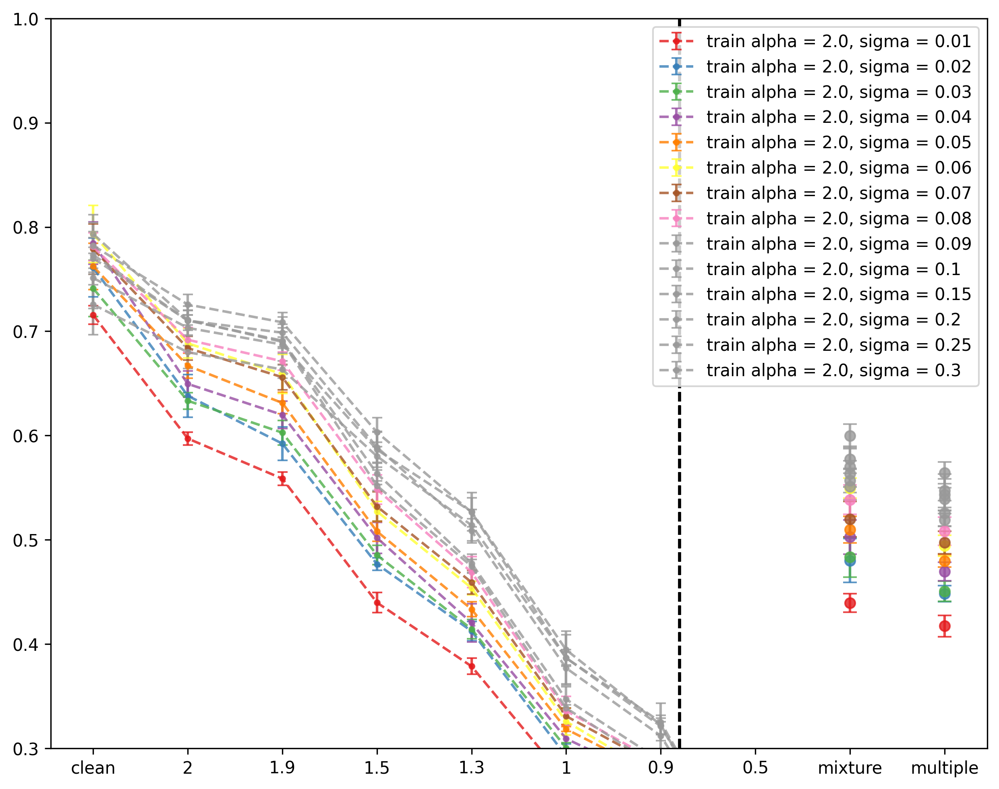

    sigma  avg_acc
11   0.20  0.53865
12   0.25  0.52593
10   0.15  0.52373
13   0.30  0.51485
9    0.10  0.50966
8    0.09  0.50708
7    0.08  0.49910
5    0.06  0.49202
6    0.07  0.49025
4    0.05  0.47400
3    0.04  0.46818
2    0.03  0.45136
1    0.02  0.45103
0    0.01  0.41928


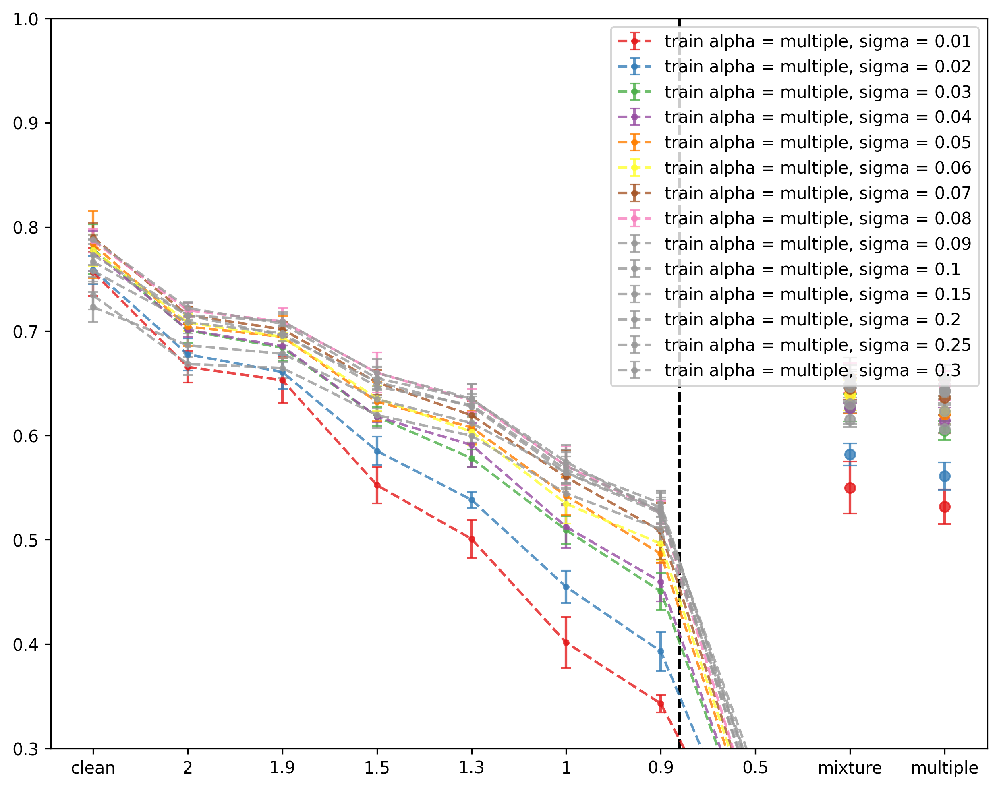

    sigma  avg_acc
10   0.15  0.61640
8    0.09  0.61566
7    0.08  0.61400
11   0.20  0.60933
9    0.10  0.60857
6    0.07  0.60585
12   0.25  0.59572
5    0.06  0.59385
4    0.05  0.59285
13   0.30  0.58307
3    0.04  0.57922
2    0.03  0.57534
1    0.02  0.53880
0    0.01  0.51232


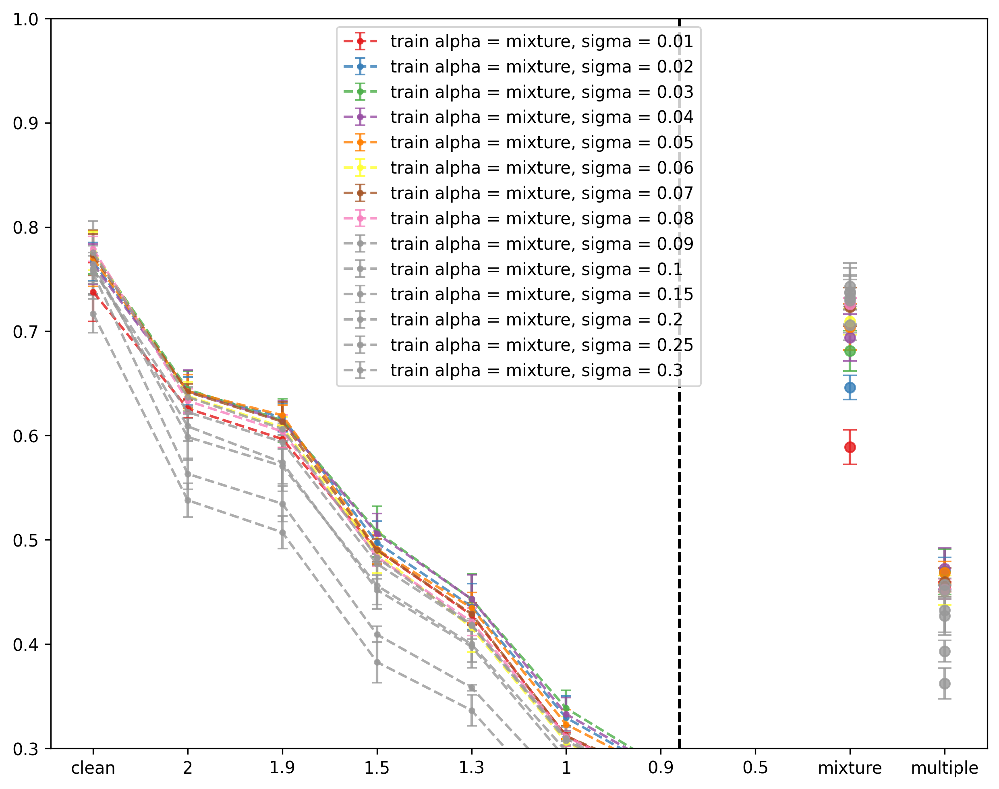

    sigma  avg_acc
2    0.03  0.49199
3    0.04  0.49116
4    0.05  0.48926
6    0.07  0.48793
9    0.10  0.48538
1    0.02  0.48458
7    0.08  0.48422
5    0.06  0.48124
8    0.09  0.47775
11   0.20  0.46716
0    0.01  0.46588
10   0.15  0.46516
12   0.25  0.44051
13   0.30  0.41476


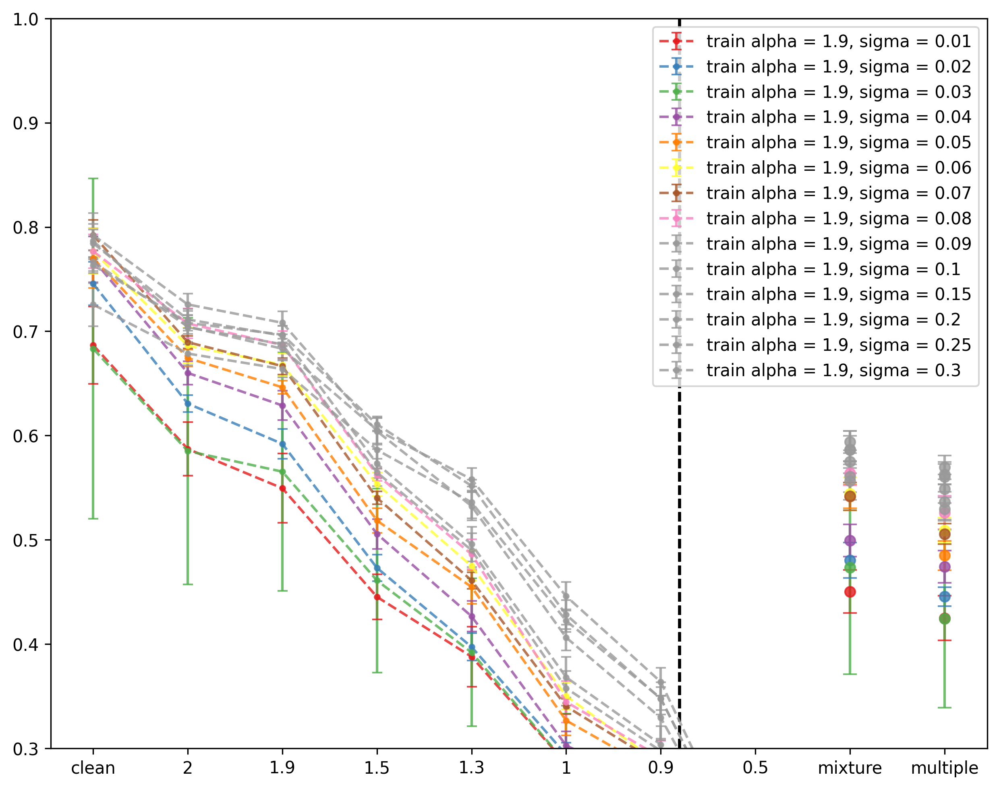

    sigma  avg_acc
12   0.25  0.54560
11   0.20  0.54319
10   0.15  0.54097
13   0.30  0.52518
9    0.10  0.51910
8    0.09  0.51378
7    0.08  0.51058
5    0.06  0.50055
6    0.07  0.49850
4    0.05  0.48516
3    0.04  0.46793
1    0.02  0.44558
2    0.03  0.42500
0    0.01  0.42074


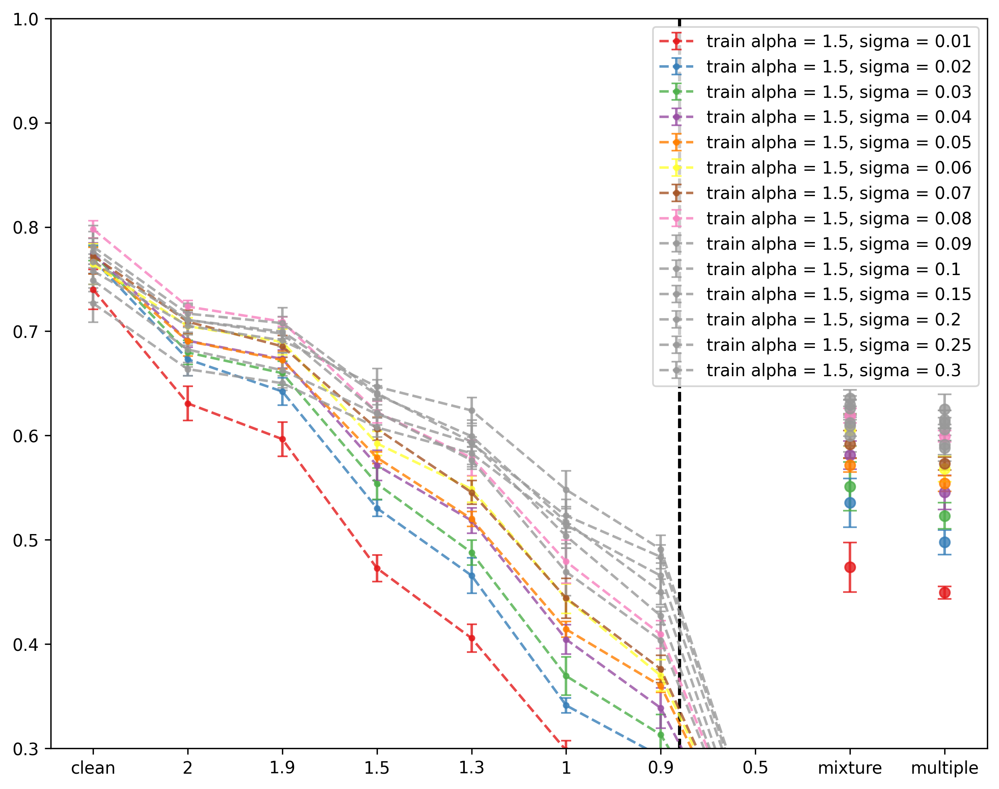

    sigma  avg_acc
11   0.20  0.59412
10   0.15  0.58158
9    0.10  0.57895
12   0.25  0.57431
7    0.08  0.57257
8    0.09  0.56341
13   0.30  0.56083
6    0.07  0.54810
5    0.06  0.54610
4    0.05  0.53048
3    0.04  0.52621
2    0.03  0.50729
1    0.02  0.49065
0    0.01  0.44773


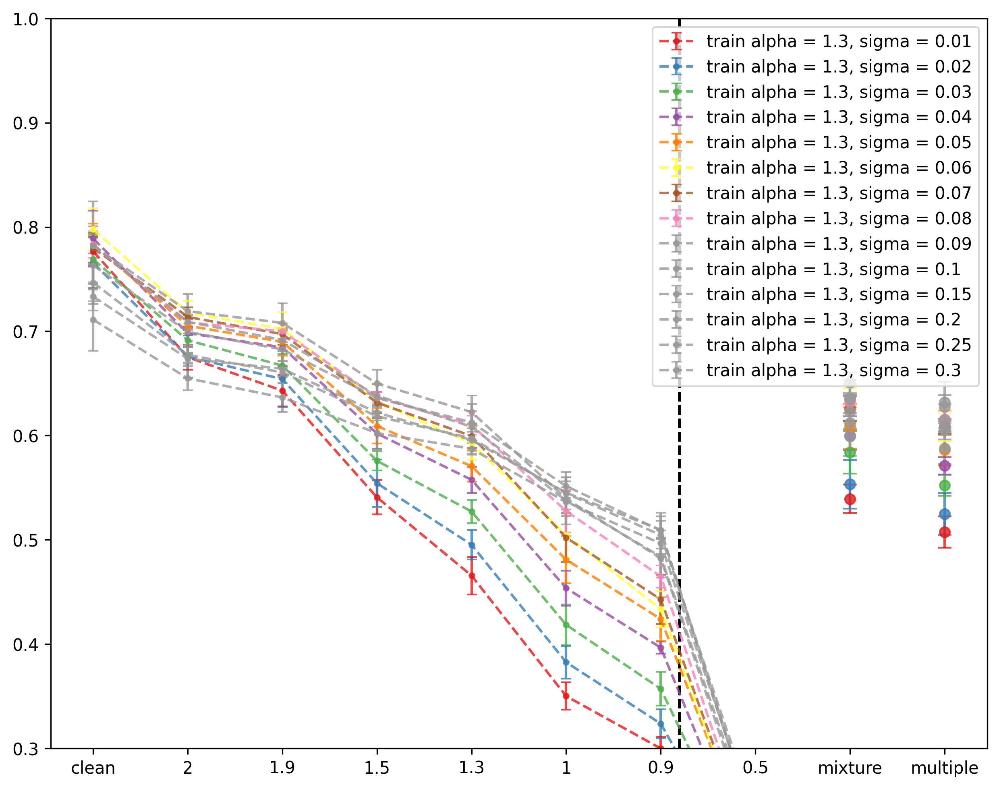

    sigma  avg_acc
8    0.09  0.59975
10   0.15  0.59425
9    0.10  0.59220
7    0.08  0.58748
12   0.25  0.58148
5    0.06  0.58104
6    0.07  0.57940
11   0.20  0.57868
4    0.05  0.56505
13   0.30  0.56412
3    0.04  0.55275
2    0.03  0.53078
1    0.02  0.50917
0    0.01  0.49591


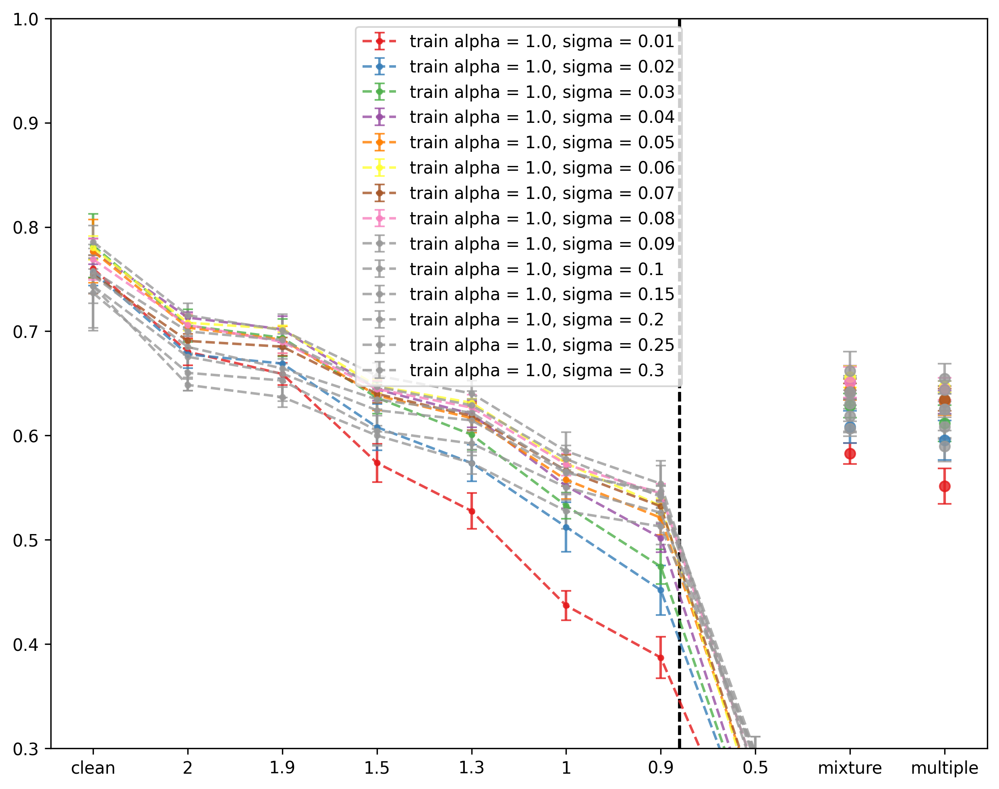

    sigma  avg_acc
8    0.09  0.62303
7    0.08  0.61255
5    0.06  0.61235
9    0.10  0.61023
4    0.05  0.60367
10   0.15  0.60242
3    0.04  0.60193
6    0.07  0.60178
11   0.20  0.59789
2    0.03  0.58805
12   0.25  0.58375
13   0.30  0.57341
1    0.02  0.56604
0    0.01  0.53357


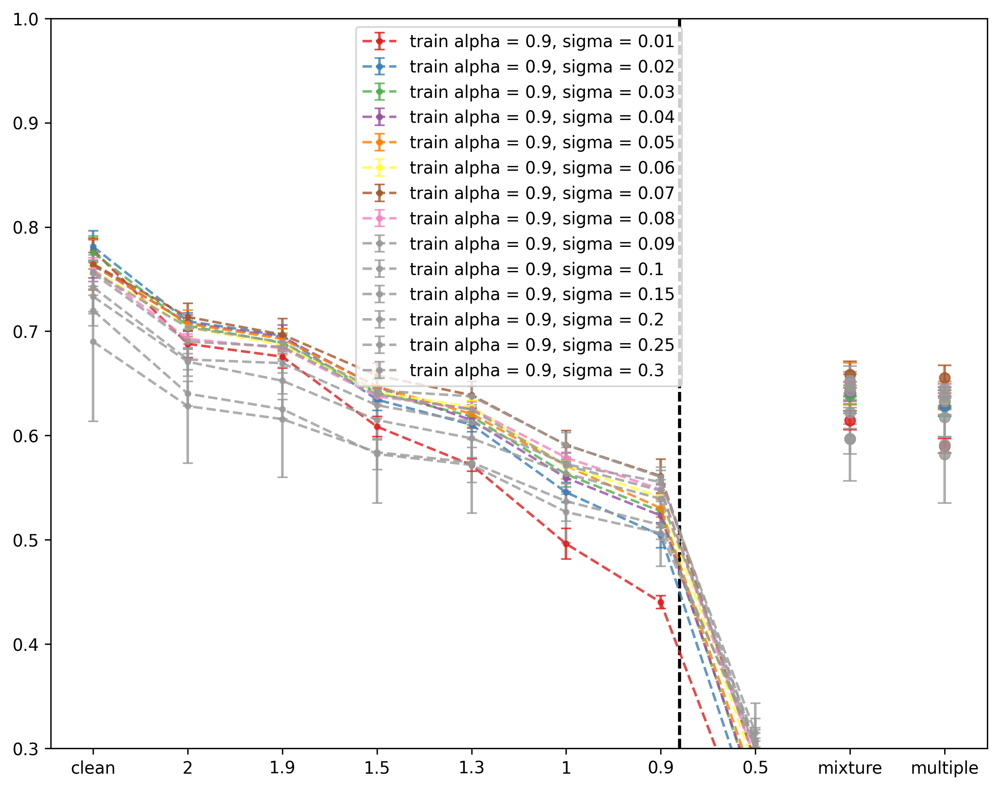

    sigma  avg_acc
6    0.07  0.62237
8    0.09  0.61820
7    0.08  0.61031
9    0.10  0.60968
5    0.06  0.60950
4    0.05  0.60842
10   0.15  0.60454
2    0.03  0.60435
3    0.04  0.60413
1    0.02  0.59791
11   0.20  0.59187
13   0.30  0.56662
0    0.01  0.56625
12   0.25  0.56213


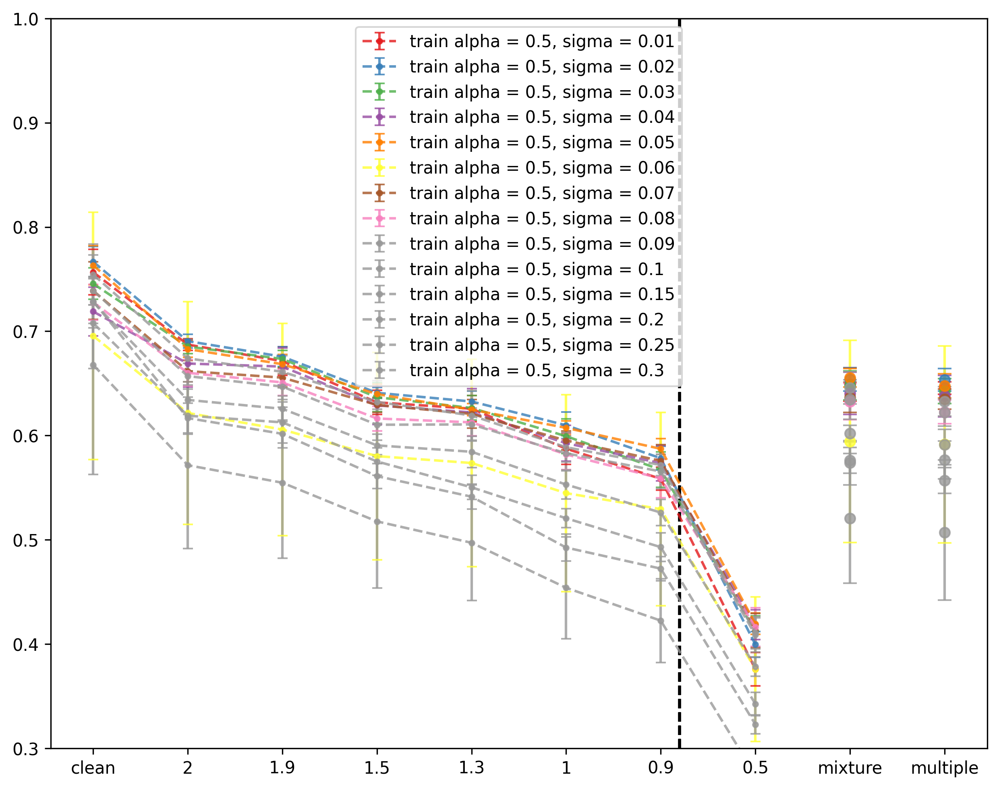

    sigma  avg_acc
1    0.02  0.63009
4    0.05  0.62959
2    0.03  0.62366
9    0.10  0.61904
0    0.01  0.61888
3    0.04  0.61680
6    0.07  0.61614
7    0.08  0.60796
8    0.09  0.60772
10   0.15  0.58130
5    0.06  0.57124
11   0.20  0.55712
12   0.25  0.54703
13   0.30  0.49869


In [2]:
from matplotlib import pyplot
depth, width = 1, 128

# plt.figure(dpi=300)
alphas = [0.0,2.0,'multiple','mixture',1.9,1.5,1.3,1.0,0.9,0.5]
palette = pyplot.get_cmap('Set1')
opt_sigma = dict()
for alpha in alphas:
    i=0
    plt.figure(figsize=(10, 8),dpi=300)
    # if alpha != 'multiple' and alpha != 'mixture':
    #     alpha = float(alpha)
# for alpha in [1.9]:
    if i == 9:
        color = '#00FFFF'
    if i == 10:
        color = 'black'
    if i == 11:
        color='fuchsia'
    if alpha == 0:
        sigma_list = [0.1]
    else:
        sigma_list = [0.01, 0.02, 0.03, 0.04, 0.05, 0.06, 0.07, 0.08, 0.09, 0.1, 0.15, 0.2, 0.25, 0.3]
    mean_list = []
    color=palette(i)
    for sigma in sigma_list:
        color=palette(i)
        # acc_path = f"../results/acc_LSTM_width{width}_depth{depth}_b32_alpha{alpha}_sigma{sigma}.txt"
        acc_path = f"../results/acc_LSTM_width{width}_depth{depth}_b32_alpha{alpha}_sigma{sigma}_0.15.txt"
        if os.path.exists(acc_path) == 0:
            print('no exists,', acc_path)
            continue
        f = open(acc_path, 'rb')
        try:
            acc = pickle.load(f)
        except:
            print("the file is empty, alpha={}".format(alpha))
            continue
        df = pd.DataFrame(acc)
        npdf = np.array(df)
        means = np.array(npdf.mean(axis=0).round(decimals=4))
        stds = np.array(npdf.std(axis=0).round(decimals=4))
        mean_list.append(np.mean(means))
        x = ['mixture','multiple','clean','2', '1.9', '1.5', '1.3', '1', '0.9', '0.5']
        if alpha == 0:
            labels = 'clean data'
        elif alpha == 2:
            labels = 'Gaussian noise, $\gamma$ = {:.3f}'.format(gamma)
        else:
            labels = 'train $\\alpha$ = {}, $\gamma$ = {:.3f}'.format(alpha, gamma)
        plt.errorbar(x[2:],means[:-2],yerr=stds[:-2],capsize=3,fmt='--.',alpha=0.8,color = color,label =labels)
        plt.axvline(x.index('0.9')-2+0.2,linestyle='--',color='black')
        plt.errorbar(x[:2],means[-2:],yerr = stds[-2:],fmt='o',capsize=4,alpha=0.8,color = color)
        i=i+1
        plt.ylim(0.3,1)
    if os.path.exists(acc_path) == 0:
        continue
    plt.legend()
    plt.show()
    tmp = pd.DataFrame({'sigma': sigma_list, 'avg_acc': mean_list})
    tmp = tmp.sort_values('avg_acc', ascending=False)
    print(tmp)
    opt_sigma[alpha] = tmp['sigma'].iloc[0]

In [3]:
opt_sigma

{2.0: 0.2,
 'multiple': 0.15,
 'mixture': 0.03,
 1.9: 0.25,
 1.5: 0.2,
 1.3: 0.09,
 1.0: 0.09,
 0.9: 0.07,
 0.5: 0.02}

In [4]:
opt_sigma[0.0]=0.01

1 128


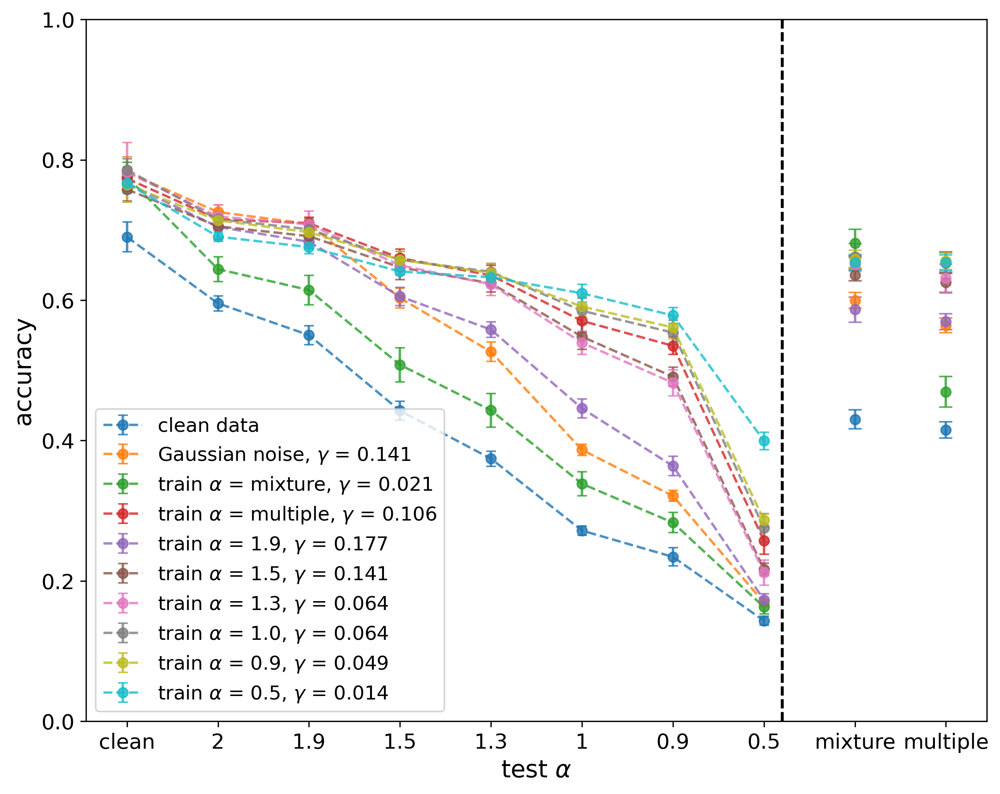

2 128


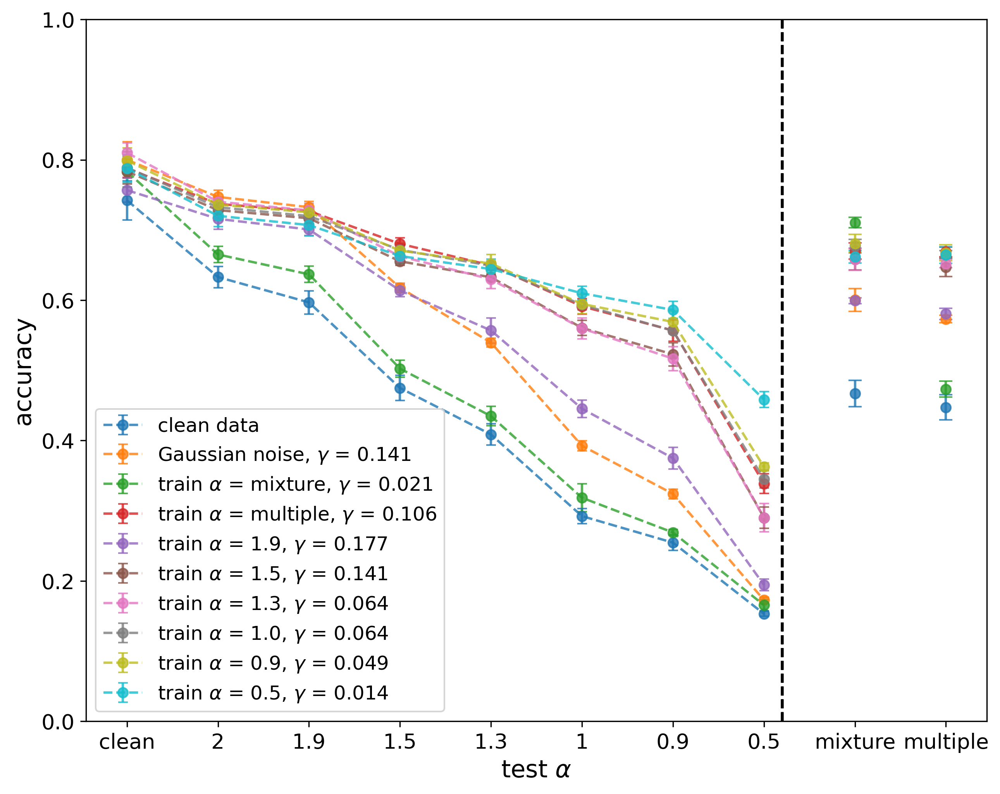

3 128


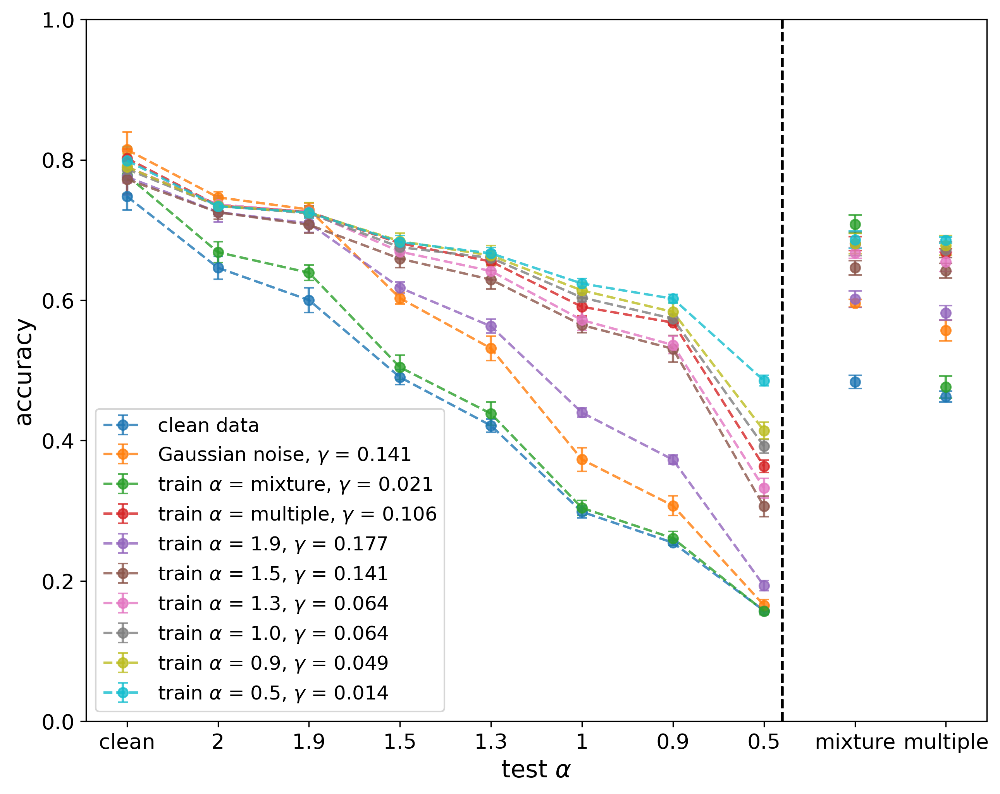

1 256


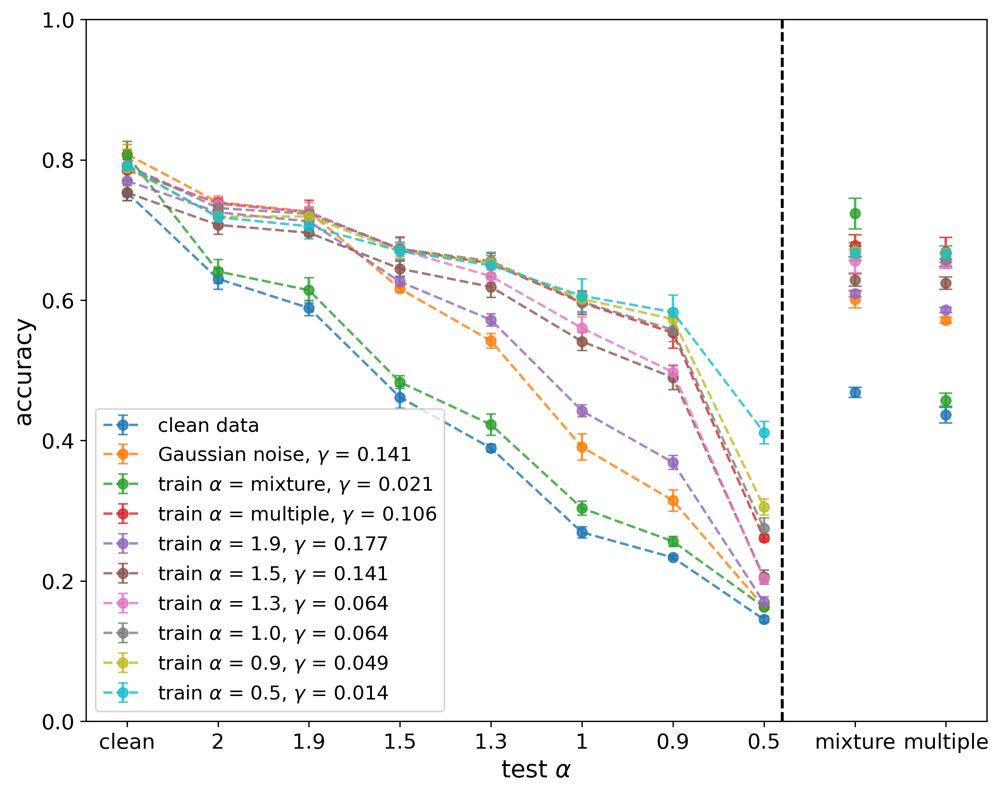

1 512


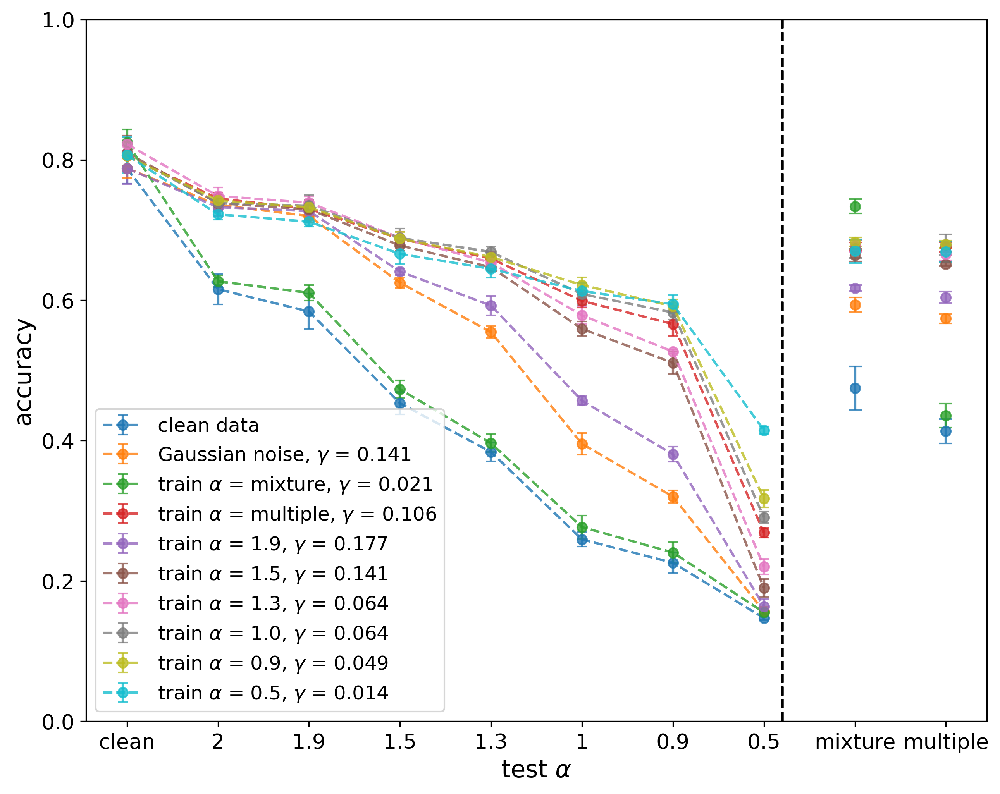

In [5]:
from matplotlib import pyplot
import seaborn as sns
for depth, width in [(1, 128), (2, 128), (3, 128), (1, 256), (1, 512)]:
    print(depth, width)
    # acc
    # plt.figure(dpi=300)
    alphas = [0.0,2.0,'mixture','multiple',1.9,1.5,1.3,1.0,0.9,0.5]
    colors = sns.color_palette(n_colors = 10)
    plt.figure(figsize=(10, 8),dpi=300)
    i = 0
    for alpha in alphas:
        # if alpha != 'multiple' and alpha != 'mixture':
        #     alpha = float(alpha)
    # for alpha in [1.9]:
        color=colors[i]
        sigma = opt_sigma[alpha]
        # acc_path = f"../results/acc_LSTM_width{width}_depth{depth}_b32_alpha{alpha}_sigma{sigma}.txt"
        acc_path = f"../results/acc_LSTM_width{width}_depth{depth}_b32_alpha{alpha}_sigma{sigma}_0.15.txt"
        if os.path.exists(acc_path) == 0:
            print('no exists,', acc_path)
            continue
        f = open(acc_path, 'rb')
        try:
            acc = pickle.load(f)
        except:
            print("the file is empty, alpha={}".format(alpha))
            continue
        df = pd.DataFrame(acc)
        npdf = np.array(df)
        means = np.array(npdf.mean(axis=0).round(decimals=4))
        stds = np.array(npdf.std(axis=0).round(decimals=4))
        x = ['mixture','multiple','clean','2', '1.9', '1.5', '1.3', '1', '0.9', '0.5']
        gamma = np.sqrt(1/2) * sigma
        if alpha == 0:
            labels = 'clean data'
        elif alpha == 2:
            labels = 'Gaussian noise, $\gamma$ = {:.3f}'.format(gamma)
        else:
            labels = 'train $\\alpha$ = {}, $\gamma$ = {:.3f}'.format(alpha, gamma)
        plt.errorbar(x[2:],means[:-2],yerr=stds[:-2],capsize=3,fmt='--o',alpha=0.8,color = color,label =labels)
        plt.axvline(x.index('0.5')-2+0.2,linestyle='--',color='black')
        plt.errorbar(x[:2],means[-2:],yerr = stds[-2:],fmt='o',capsize=4,alpha=0.8,color = color)
        i=i+1
    plt.xticks(fontsize=13)
    plt.yticks(fontsize=13)
    plt.ylim([0, 1])
    plt.xlabel("test $\\alpha$",fontsize=15)#横坐标名字
    plt.ylabel("accuracy",fontsize=15)#纵坐标名字
    plt.legend(loc=0,fontsize=12)#图例
    if not os.path.exists('./figure'):
            os.makedirs('./figure')
    plt.savefig(f'./figure/libras_{width}_{depth}.png',bbox_inches='tight')
    plt.show()

In [24]:
from matplotlib import pyplot
import seaborn as sns
depth, width = 1, 128
# acc
# plt.figure(dpi=300)
alphas = [0.0,2.0,'mixture','multiple',1.9,1.5,1.3,1.0,0.9,0.5]
colors = sns.color_palette(n_colors = 10)
plt.figure(figsize=(10, 8),dpi=300)
i = 0
alphaToacc = dict()
for alpha in alphas:
    # if alpha != 'multiple' and alpha != 'mixture':
    #     alpha = float(alpha)
# for alpha in [1.9]:
    color=colors[i]
    sigma = opt_sigma[alpha]
    # acc_path = f"../results/acc_LSTM_width{width}_depth{depth}_b32_alpha{alpha}_sigma{sigma}.txt"
    acc_path = f"../results/acc_LSTM_width{width}_depth{depth}_b32_alpha{alpha}_sigma{sigma}_0.15.txt"
    if os.path.exists(acc_path) == 0:
        print('no exists,', acc_path)
        continue
    f = open(acc_path, 'rb')
    try:
        acc = pickle.load(f)
    except:
        print("the file is empty, alpha={}".format(alpha))
        continue
    df = pd.DataFrame(acc)
    npdf = np.array(df)
    means = np.array(npdf.mean(axis=0).round(decimals=4))
    stds = np.array(npdf.std(axis=0).round(decimals=4))
    alphaToacc[alpha] = np.mean(means)
    x = ['mixture','multiple','clean','2', '1.9', '1.5', '1.3', '1', '0.9', '0.5']
    i=i+1

<Figure size 3000x2400 with 0 Axes>

In [25]:
alphaToacc

{0.0: 0.4147,
 2.0: 0.53865,
 'mixture': 0.49199000000000004,
 'multiple': 0.6164000000000001,
 1.9: 0.5456,
 1.5: 0.59412,
 1.3: 0.59975,
 1.0: 0.62303,
 0.9: 0.6223700000000001,
 0.5: 0.63009}

In [30]:
for i in [1.0, 0.9, 'multiple']:
    print(i)
    print('比clean', alphaToacc[i] / alphaToacc[0.0] - 1)
    print('比Gaussian', alphaToacc[i] / alphaToacc[2.0] - 1)

1.0
比clean 0.5023631540872919
比Gaussian 0.1566508864754479
0.9
比clean 0.5007716421509527
比Gaussian 0.15542560103963643
multiple
比clean 0.48637569327224517
比Gaussian 0.14434233732479362


../results/acc_LSTM_width128_depth1_b32_alphamultiple_sigma0.15_0.15.txt
[0.7154]
../results/acc_LSTM_width128_depth2_b32_alphamultiple_sigma0.15_0.15.txt
[0.7154, 0.7371]
../results/acc_LSTM_width128_depth3_b32_alphamultiple_sigma0.15_0.15.txt
[0.7154, 0.7371, 0.7347]
../results/acc_LSTM_width128_depth1_b32_alphamultiple_sigma0.15_0.15.txt
[0.7096]
../results/acc_LSTM_width128_depth2_b32_alphamultiple_sigma0.15_0.15.txt
[0.7096, 0.727]
../results/acc_LSTM_width128_depth3_b32_alphamultiple_sigma0.15_0.15.txt
[0.7096, 0.727, 0.7259]
../results/acc_LSTM_width128_depth1_b32_alphamultiple_sigma0.15_0.15.txt
[0.66]
../results/acc_LSTM_width128_depth2_b32_alphamultiple_sigma0.15_0.15.txt
[0.66, 0.6803]
../results/acc_LSTM_width128_depth3_b32_alphamultiple_sigma0.15_0.15.txt
[0.66, 0.6803, 0.6811]
../results/acc_LSTM_width128_depth1_b32_alphamultiple_sigma0.15_0.15.txt
[0.6353]
../results/acc_LSTM_width128_depth2_b32_alphamultiple_sigma0.15_0.15.txt
[0.6353, 0.6496]
../results/acc_LSTM_width1

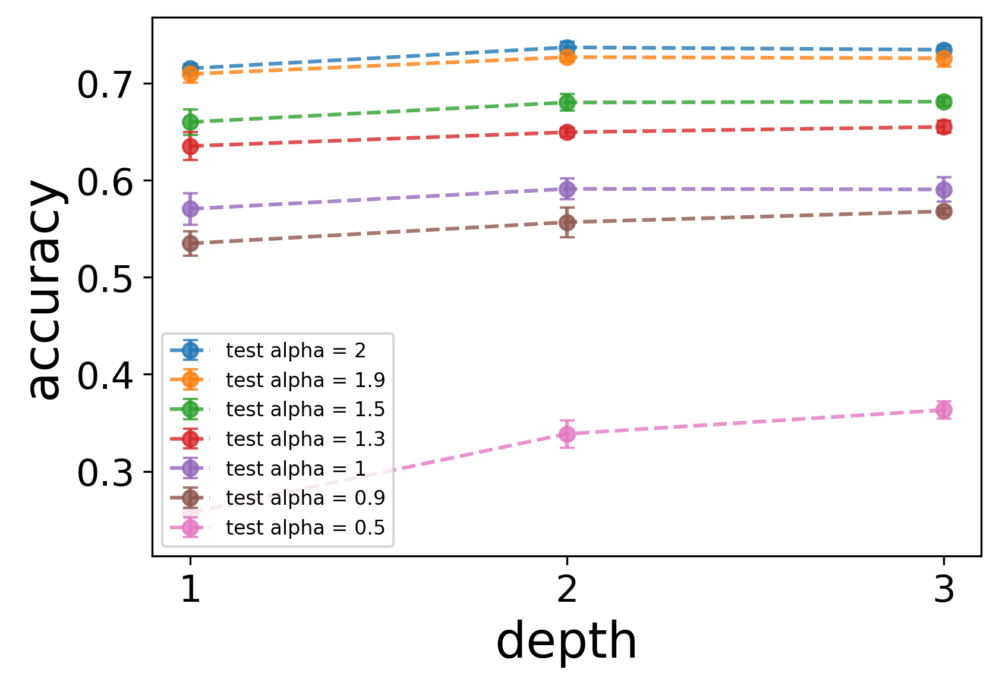

In [5]:
from matplotlib import pyplot
train_alpha_list = ['mix',6,0,2,1.9,1.5,1.3,1,0.9,0.5]
train_alpha_list_dic = {"mix":8, 6:9, 0:0, 2:1, 1.9:2, 1.5:3, 1.3:4, 1:5, 0.9:6, 0.5:7}
# test_alpha = 1.3
alphas = ['multiple']
plt_means=[]
plt_std=[]
for alpha in alphas:
    plt.figure(dpi=300)
    opt_sigma = {2.0: 0.2, 'multiple': 0.15, 'mixture': 0.03, 1.9: 0.25, 1.5: 0.2, 1.3: 0.09, 1.0: 0.09, 0.9: 0.07, 0.5: 0.02, 0.0: 0.01}
    sigma = opt_sigma[alpha]
    for train_alpha in train_alpha_list:
        width = 128
        depths=[1,2,3]
        plt_means = []
        plt_std=[]
        for depth in depths:
            # acc
            # plt.figure(figsize=(10, 8),dpi=300)
            # alphas = [0, 2, 1.9, 1.5, 1.3, 1, 0.9, 0.5,6,'mix',5.5]
            palette = pyplot.get_cmap('Set1')
            i=0
            # for alpha in alphas:
                # if alpha != 'multiple' and alpha != 'mixture':
                #     alpha = float(alpha)
            # for alpha in [1.9]:
            # if depth == 4 or depth == 5:
            #     acc_path = "./mnist_fixseed/acc_{}_width{}_depth{}_b{}_alpha{}_sigma{}_lr0.0005.txt".format(network, width, depth, b, alpha, sigma)
            # else:
            acc_path = f"../results/acc_LSTM_width{width}_depth{depth}_b32_alpha{alpha}_sigma{sigma}_0.15.txt"
            print(acc_path)
            if os.path.exists(acc_path) == 0:
                print('no exists, alpha={}'.format(alpha))
            else:
                f = open(acc_path, 'rb')
                try:
                    acc = pickle.load(f)
                except:
                    print("the file is empty, alpha={}".format(alpha))
                    continue
                df = pd.DataFrame(acc)
                npdf = np.array(df)
                npdf = npdf.reshape(5,10)
                means = np.array(npdf.mean(axis=0).round(decimals=4))
                stds = np.array(npdf.std(axis=0).round(decimals=4))
                plt_means.append(means[index])
                plt_std.append(stds[index])
                print(plt_means)
                    
        # plt.plot(depths,plt_means,label='test alpha is {}'.format(test_alpha))
        plt.errorbar([1,2,3],plt_means,yerr=plt_std,capsize=3,fmt='--o',alpha=0.8,label ='test alpha = {}'.format(test_alpha))
        plt.xticks([1,2,3],fontsize=15)
        plt.yticks(fontsize=15)
        plt.legend(fontsize=8)
        plt.xlabel('depth',fontsize=20)
        plt.ylabel('accuracy',fontsize=20)
        # plt.title('train alpha is {}'.format(alpha))
        plt.savefig('./figure/libras_depth_width{}_trainalpha{}.png'.format(width,alpha),bbox_inches='tight')

../results/acc_LSTM_width128_depth1_b32_alphamultiple_sigma0.15_0.15.txt
[0.7154]
../results/acc_LSTM_width256_depth1_b32_alphamultiple_sigma0.15_0.15.txt
[0.7154, 0.7382]
../results/acc_LSTM_width512_depth1_b32_alphamultiple_sigma0.15_0.15.txt
[0.7154, 0.7382, 0.7449]
../results/acc_LSTM_width128_depth1_b32_alphamultiple_sigma0.15_0.15.txt
[0.7096]
../results/acc_LSTM_width256_depth1_b32_alphamultiple_sigma0.15_0.15.txt
[0.7096, 0.7251]
../results/acc_LSTM_width512_depth1_b32_alphamultiple_sigma0.15_0.15.txt
[0.7096, 0.7251, 0.7301]
../results/acc_LSTM_width128_depth1_b32_alphamultiple_sigma0.15_0.15.txt
[0.66]
../results/acc_LSTM_width256_depth1_b32_alphamultiple_sigma0.15_0.15.txt
[0.66, 0.673]
../results/acc_LSTM_width512_depth1_b32_alphamultiple_sigma0.15_0.15.txt
[0.66, 0.673, 0.6875]
../results/acc_LSTM_width128_depth1_b32_alphamultiple_sigma0.15_0.15.txt
[0.6353]
../results/acc_LSTM_width256_depth1_b32_alphamultiple_sigma0.15_0.15.txt
[0.6353, 0.6523]
../results/acc_LSTM_width5

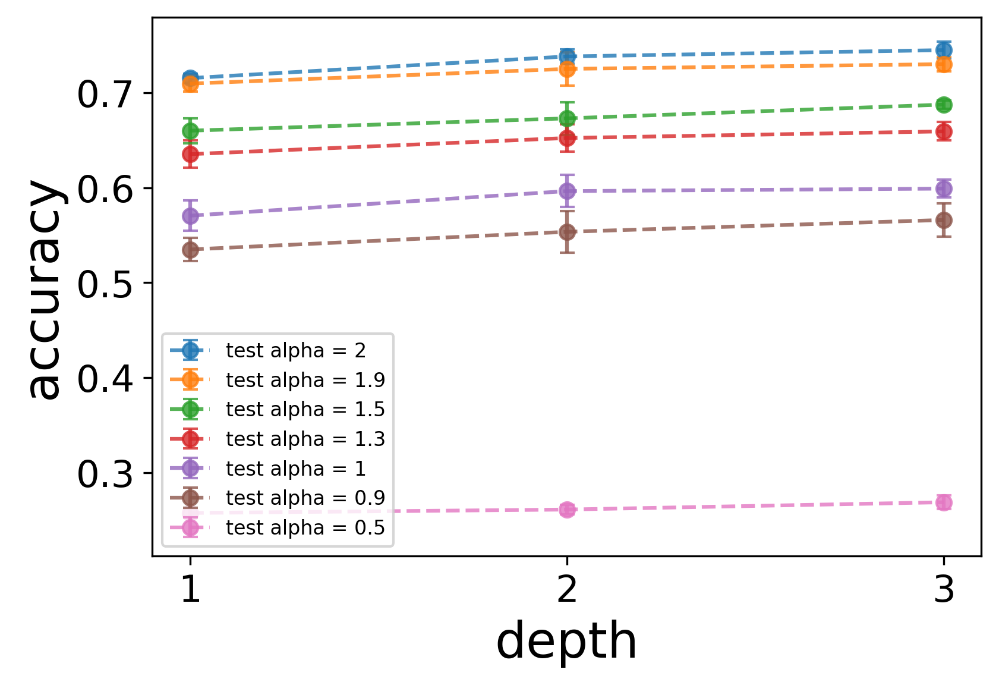

In [6]:
from matplotlib import pyplot
test_alpha_list = ['mix',6,0,2,1.9,1.5,1.3,1,0.9,0.5]
test_alpha_dic = {"mix":8, 6:9, 0:0, 2:1, 1.9:2, 1.5:3, 1.3:4, 1:5, 0.9:6, 0.5:7}
# test_alpha = 1.3
alphas = ['multiple']
plt_means=[]
plt_std=[]
for alpha in alphas:
    plt.figure(dpi=300)
    opt_sigma = {2.0: 0.2, 'multiple': 0.15, 'mixture': 0.03, 1.9: 0.25, 1.5: 0.2, 1.3: 0.09, 1.0: 0.09, 0.9: 0.07, 0.5: 0.02, 0.0: 0.01}
    sigma = opt_sigma[alpha]
    for test_alpha in [2,1.9,1.5,1.3,1,0.9,0.5]:
        index = test_alpha_dic[test_alpha]
        depth = 1
        widths=[128,256,512]
        plt_means = []
        plt_std=[]
        for width in widths:
            # acc
            # plt.figure(figsize=(10, 8),dpi=300)
            # alphas = [0, 2, 1.9, 1.5, 1.3, 1, 0.9, 0.5,6,'mix',5.5]
            palette = pyplot.get_cmap('Set1')
            i=0
            # for alpha in alphas:
                # if alpha != 'multiple' and alpha != 'mixture':
                #     alpha = float(alpha)
            # for alpha in [1.9]:
            # if depth == 4 or depth == 5:
            #     acc_path = "./mnist_fixseed/acc_{}_width{}_depth{}_b{}_alpha{}_sigma{}_lr0.0005.txt".format(network, width, depth, b, alpha, sigma)
            # else:
            acc_path = f"../results/acc_LSTM_width{width}_depth{depth}_b32_alpha{alpha}_sigma{sigma}_0.15.txt"
            print(acc_path)
            if os.path.exists(acc_path) == 0:
                print('no exists, alpha={}'.format(alpha))
            else:
                f = open(acc_path, 'rb')
                try:
                    acc = pickle.load(f)
                except:
                    print("the file is empty, alpha={}".format(alpha))
                    continue
                df = pd.DataFrame(acc)
                npdf = np.array(df)
                npdf = npdf.reshape(5,10)
                means = np.array(npdf.mean(axis=0).round(decimals=4))
                stds = np.array(npdf.std(axis=0).round(decimals=4))
                plt_means.append(means[index])
                plt_std.append(stds[index])
                print(plt_means)
                    
        # plt.plot(depths,plt_means,label='test alpha is {}'.format(test_alpha))
        plt.errorbar([1,2,3],plt_means,yerr=plt_std,capsize=3,fmt='--o',alpha=0.8,label ='test alpha = {}'.format(test_alpha))
        plt.xticks([1,2,3],fontsize=15)
        plt.yticks(fontsize=15)
        plt.legend(fontsize=8)
        plt.xlabel('depth',fontsize=20)
        plt.ylabel('accuracy',fontsize=20)
        # plt.title('train alpha is {}'.format(alpha))
        plt.savefig('./figure/libras_width_depth{}_trainalpha{}.png'.format(depth,alpha),bbox_inches='tight')

test on assymetric case

In [8]:
y_test = np.tile(y_te, (aug_times_test+1,1))
for alpha_test in [2,1.9,1.5,1.3,1,0.9, 0.5]:
    for beta in [0.2, -0.2, 0.5, -0.5, 0.8, -0.8, 1, -1]:
        X_noise_test = np.tile(X_te,(aug_times_test,1,1))
        X_noise_test = stable_noise(X_noise_test, alpha=alpha_test, beta=beta, scale=scale)[0]
        X_test = np.vstack((X_te, X_noise_test))
        # fw = open(f"{alpha_test}_libras.txt", "wb")
        fw = open(f"testset/assymetric/alpha{alpha_test}_beta{beta}_libras_{sigma}.txt", "wb")
        pickle.dump((X_test, y_test), fw)

In [12]:
import models
from tensorflow.keras.optimizers import Nadam
alpha_test_list = [0, 2, 1.9, 1.5, 1.3, 1, 0.9, 0.5]
beta_list = [0.2, -0.2, 0.5, -0.5, 0.8, -0.8, 1, -1]
alpha_train_list = [0.0, 2.0, 1.9, 1.5, 1.3, 1.0, 0.9, 0.5, 'mixture', 'multiple']
opt_sigma = {2.0: 0.2,
 'multiple': 0.15,
 'mixture': 0.03,
 1.9: 0.25,
 1.5: 0.2,
 1.3: 0.09,
 1.0: 0.09,
 0.9: 0.07,
 0.5: 0.02,
 0.0: 0.01}
b = 32
lr = 0.001
for alpha_train in alpha_train_list:
    sigma = opt_sigma[alpha_train]
    print(f'sigma={sigma}')
    for depth, width in [(1, 128)]:
        savepath = "../results/acc_LSTM_width{}_depth{}_b{}_alpha{}_sigma{}_0.15_testonassymetric.txt".format(width,depth,b,alpha_train,sigma)
        if os.path.exists(savepath):
            print(savepath, 'exists!')
            continue
        print(f'depth={depth}, width={width}')
        lr = 0.001
        iters = 10000
        optm = Nadam(lr=lr)
        model = models.get_model('lstm_self', input_shape, nb_class, width, depth)
        model.compile(optimizer=optm, loss='categorical_crossentropy', metrics=['accuracy'])
        ls_acc_repeat = []
        for num in range(5):
            model.load_weights('../models/libras_LSTM_width{}_depth{}_b{}_alpha{}_sigma{}_num{}_lr{}_iter{}.h5'.format(width, depth, b, alpha_train, sigma, num, lr, iters))
            ls_acc = []
            for alpha_test in alpha_test_list:
                for beta in beta_list:
                    print('alpha_test=',alpha_test,'beta=',beta)
                    if alpha_test == 0:
                        acc = model.evaluate(X_te, y_te)[1]
                    else:
                        # X_test, y_test = pickle.load(open(f"{alpha_test}_libras.txt", 'rb'))
                        X_test, y_test = pickle.load(open(f"{alpha_test}_libras_0.15.txt", 'rb'))
                        acc = model.evaluate(X_test, y_test)[1]
                    print(acc)
                    ls_acc.append(acc)
            ls_acc_repeat.append(ls_acc)
            # with open("../results/acc_LSTM_width{}_depth{}_b{}_alpha{}_sigma{}.txt".format(width,depth,b,alpha_train,sigma), "wb") as path_acc:
        with open(savepath, "wb") as path_acc:
            pickle.dump(ls_acc_repeat, path_acc)

sigma=0.01
depth=1, width=128
Model: "model_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_3 (InputLayer)         [(None, 45, 2)]           0         
_________________________________________________________________
lstm_2 (LSTM)                (None, 128)               67072     
_________________________________________________________________
dense_2 (Dense)              (None, 15)                1935      
Total params: 69,007
Trainable params: 69,007
Non-trainable params: 0
_________________________________________________________________
alpha_test= 0 beta= 0.2
6/6 [==============================] - 1s 15ms/step - loss: 2.5820 - accuracy: 0.6494
0.6499999761581421
alpha_test= 0 beta= -0.2
6/6 [==============================] - 0s 14ms/step - loss: 2.6217 - accuracy: 0.6500
0.6499999761581421
alpha_test= 0 beta= 0.5
6/6 [==============================] - 0s 15ms/step - loss: 2.6217 - acc

In [7]:
from matplotlib import pyplot
depth, width = 1, 128
opt_sigma = {2.0: 0.2,
 'multiple': 0.15,
 'mixture': 0.03,
 1.9: 0.25,
 1.5: 0.2,
 1.3: 0.09,
 1.0: 0.09,
 0.9: 0.07,
 0.5: 0.02,
 0.0: 0.01}
# plt.figure(dpi=300)
alphas = [0.0,2.0,'multiple','mixture',1.9,1.5,1.3,1.0,0.9,0.5]
palette = pyplot.get_cmap('Set1')
mean_list = []
std_list = []
for alpha in alphas:
    sigma = opt_sigma[alpha]
    
    acc_path = f"../results/acc_LSTM_width{width}_depth{depth}_b32_alpha{alpha}_sigma{sigma}_0.15_testonassymetric.txt"
    if os.path.exists(acc_path) == 0:
        print('no exists,', acc_path)
        continue
    f = open(acc_path, 'rb')
    try:
        acc = pickle.load(f)
    except:
        print("the file is empty, alpha={}".format(alpha))
        continue
    df = pd.DataFrame(acc)
    npdf = np.array(df)
    means = np.array(npdf.mean(axis=0).round(decimals=4))
    stds = np.array(npdf.std(axis=0).round(decimals=4))
    mean_list.append(means)
    std_list.append(stds)

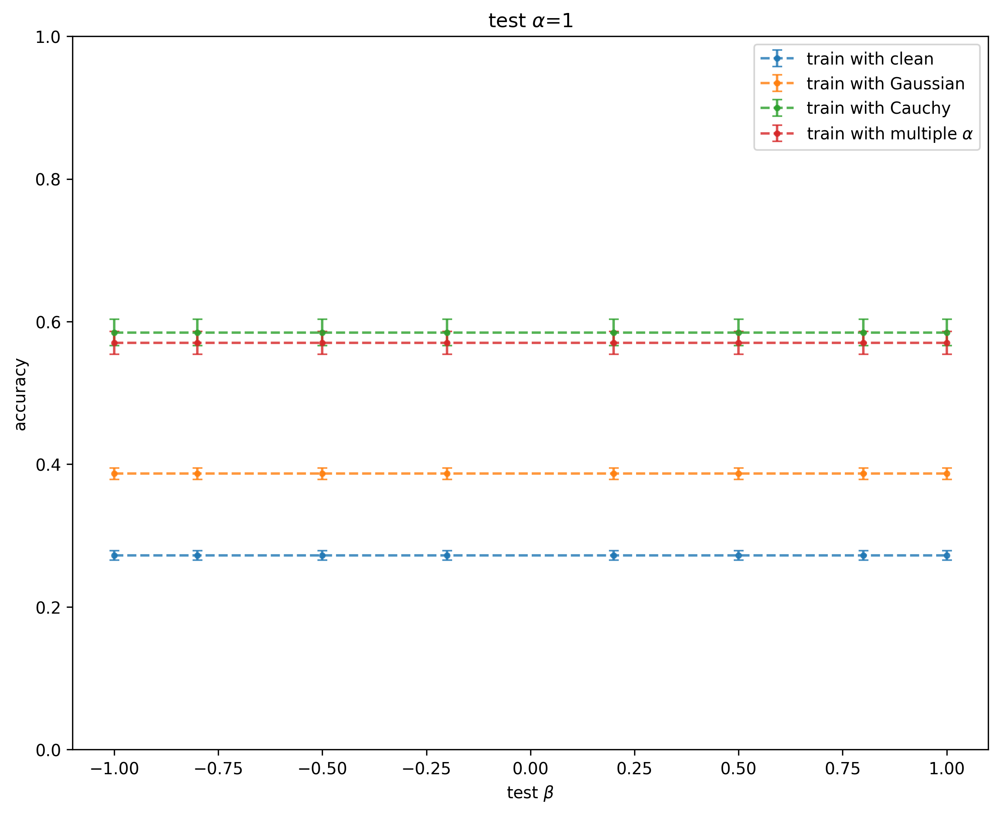

In [8]:
j = 4
# LSTM的test结果不小心把alpha=0也放进去了，在第一个
plt.figure(figsize=[10,8],dpi=300)
result_clean = mean_list[0].reshape(8, 8)[j+1]
std_clean = std_list[0].reshape(8, 8)[j+1]
result_gaussian = mean_list[1].reshape(8, 8)[j+1]
std_gaussian = std_list[1].reshape(8, 8)[j+1]
result_cauchy = mean_list[7].reshape(8, 8)[j+1]
std_cauchy = std_list[7].reshape(8, 8)[j+1]
result_multiple = mean_list[2].reshape(8, 8)[j+1]
std_multiple = std_list[2].reshape(8, 8)[j+1]
beta_list = [0.2, -0.2, 0.5, -0.5, 0.8, -0.8, 1, -1]
idx = [7, 5, 3, 1, 0, 2, 4, 6]
x = [beta_list[id] for id in idx]
plt.errorbar(x, result_clean,yerr=std_clean,capsize=3,fmt='--.',alpha=0.8,label ='train with clean')
plt.errorbar(x, result_gaussian,yerr=std_gaussian,capsize=3,fmt='--.',alpha=0.8,label ='train with Gaussian')
plt.errorbar(x, result_cauchy,yerr=std_cauchy,capsize=3,fmt='--.',alpha=0.8,label ='train with Cauchy')
plt.errorbar(x, result_multiple,yerr=std_multiple,capsize=3,fmt='--.',alpha=0.8,label ='train with multiple $\\alpha$')
plt.xlabel('test $\\beta$')
plt.ylabel('accuracy')
plt.legend()
plt.ylim(0,1)
plt.title('test $\\alpha$=1')
plt.savefig('figure/libras_assy.png')
plt.show()

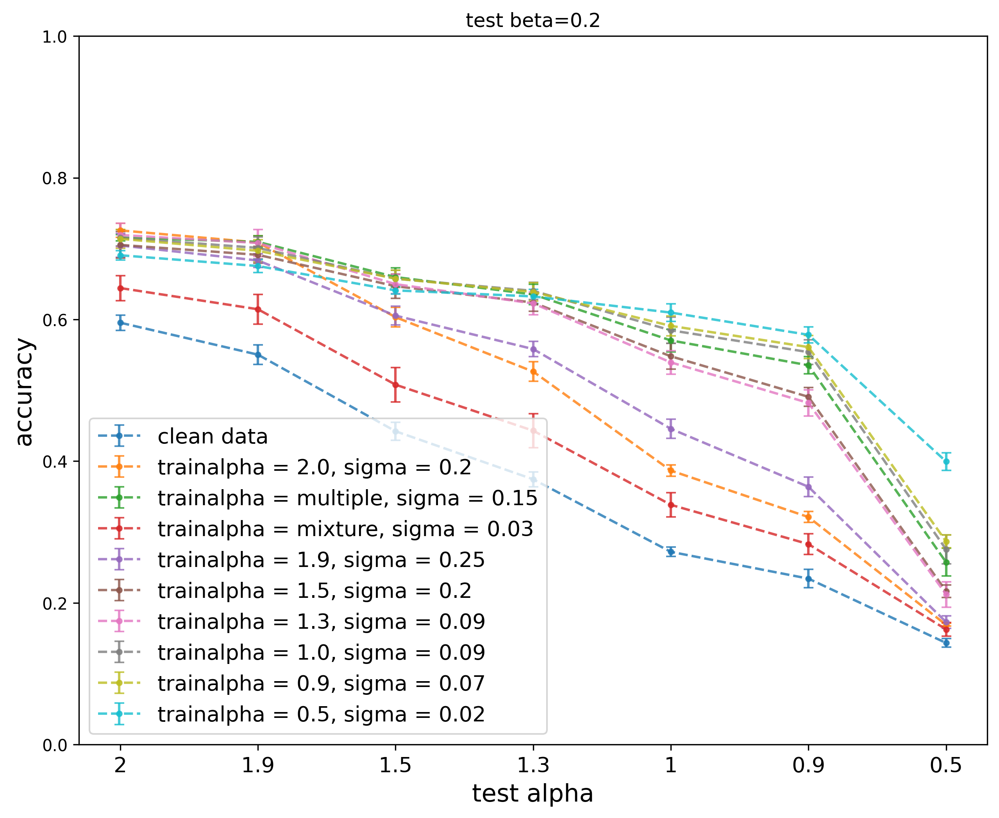

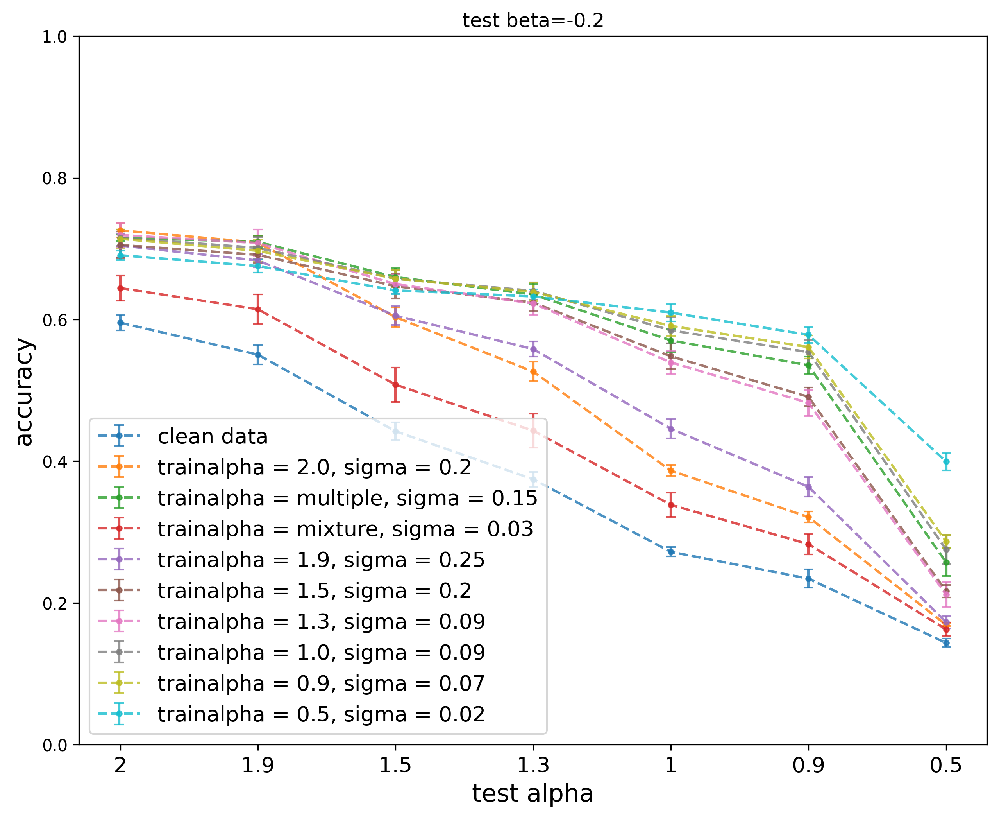

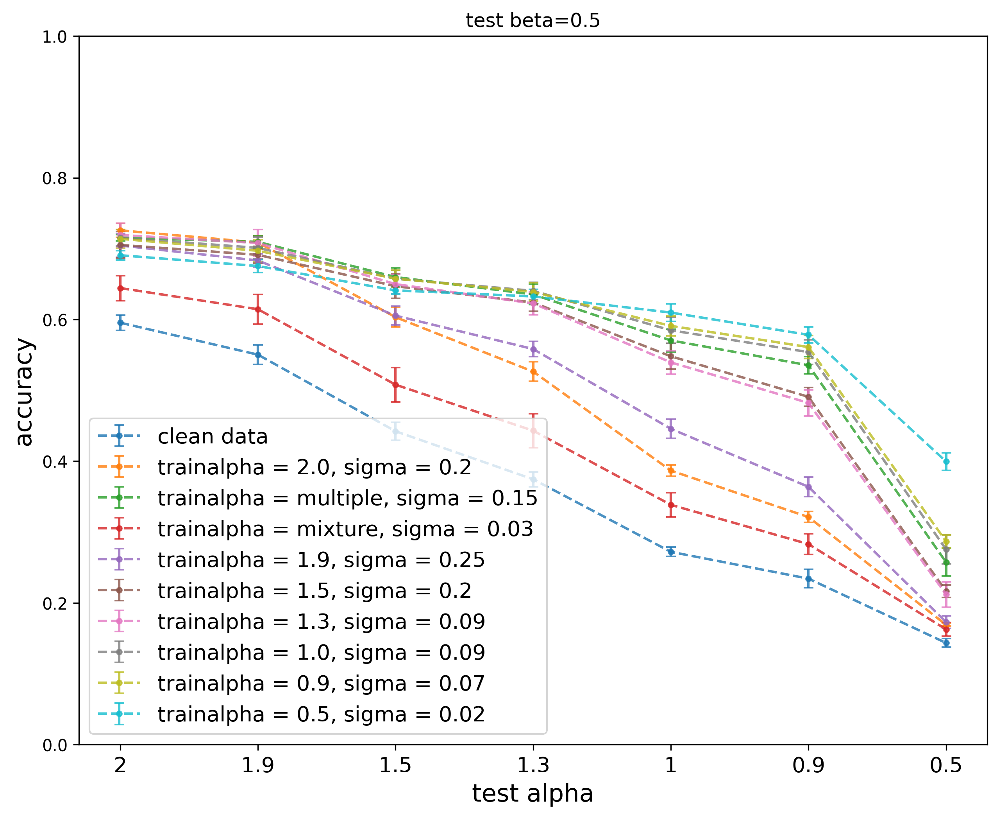

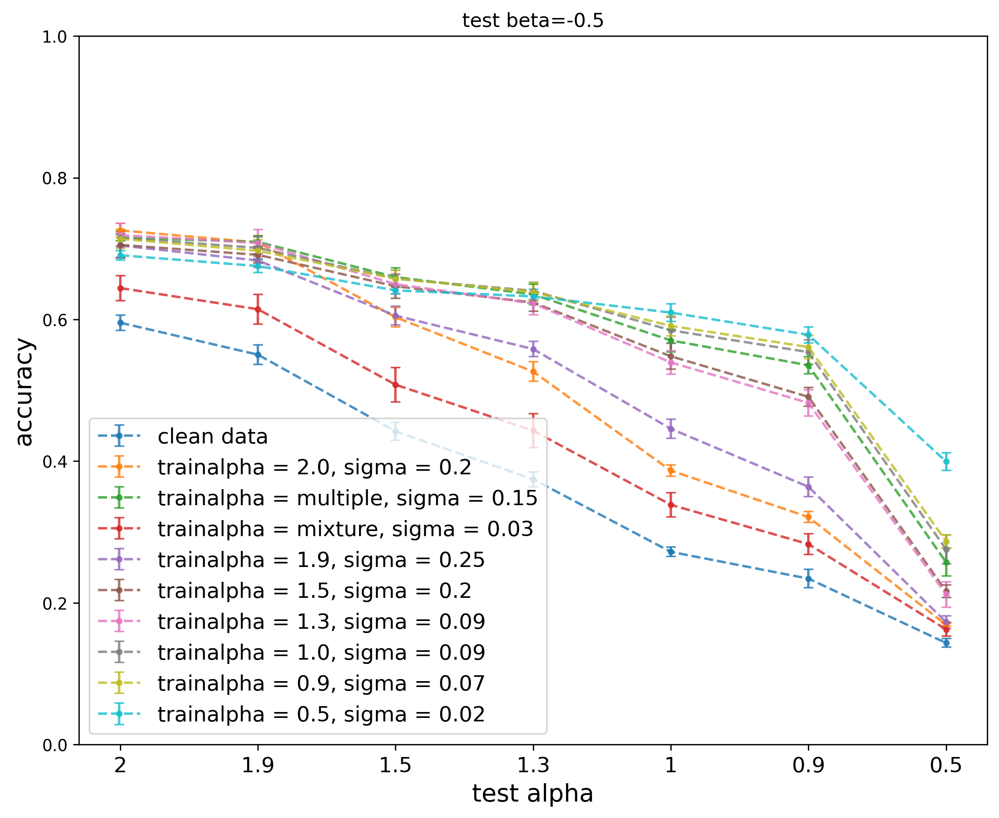

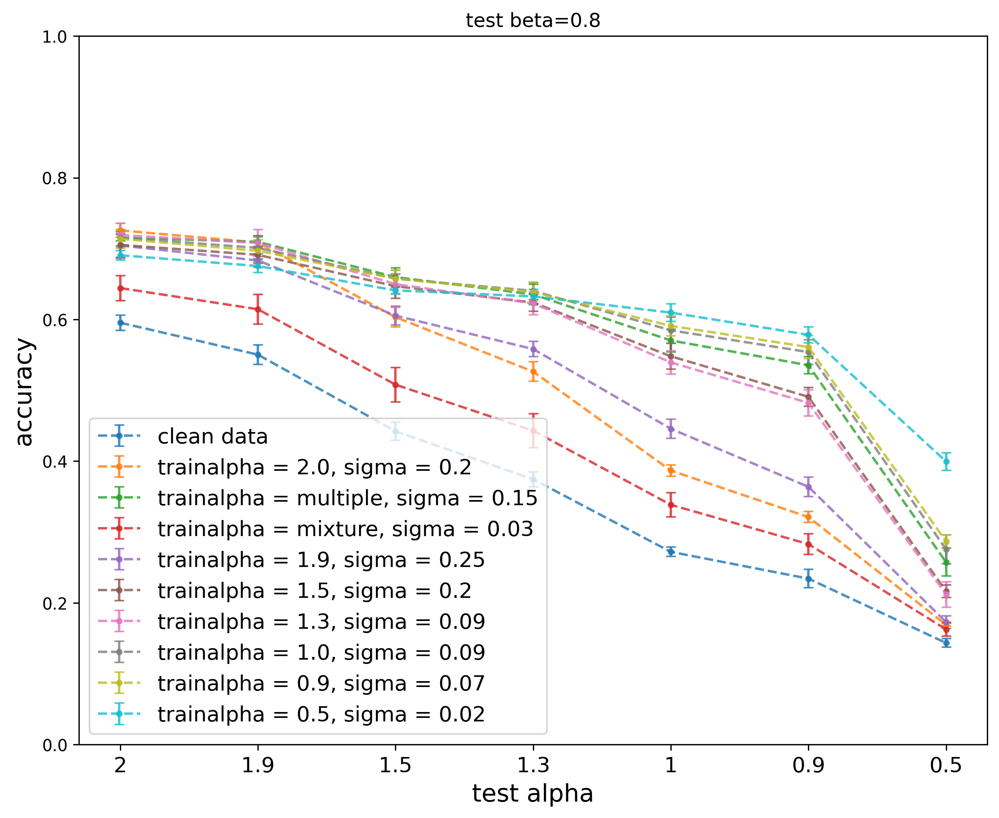

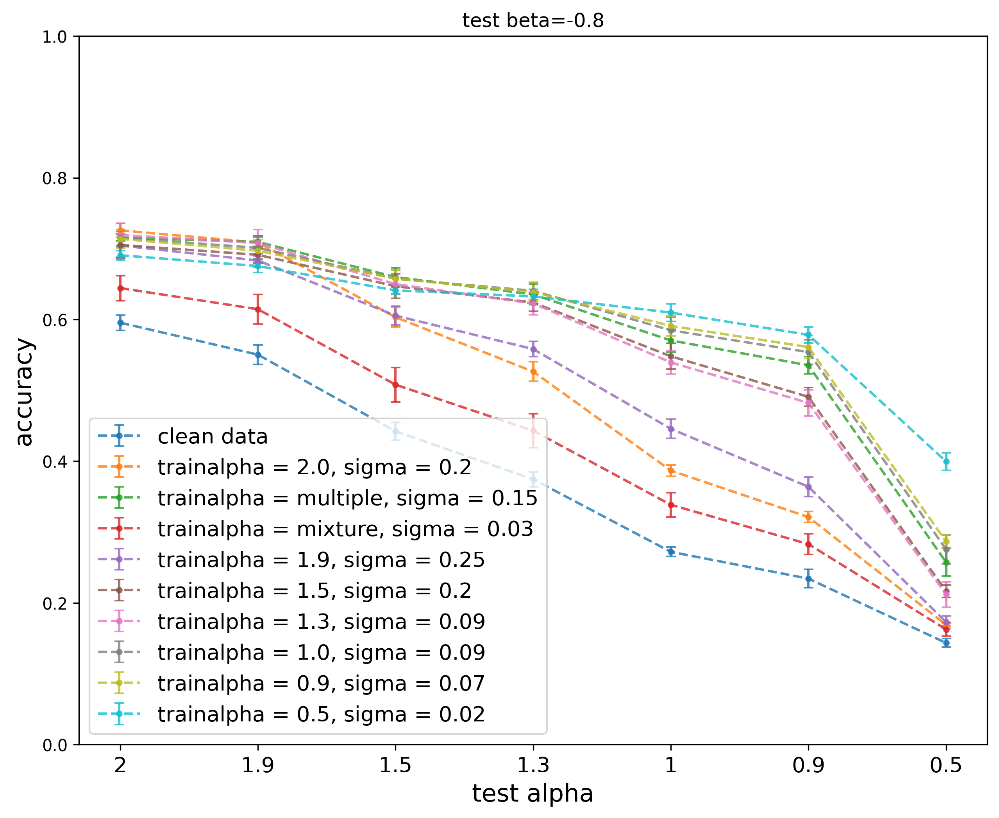

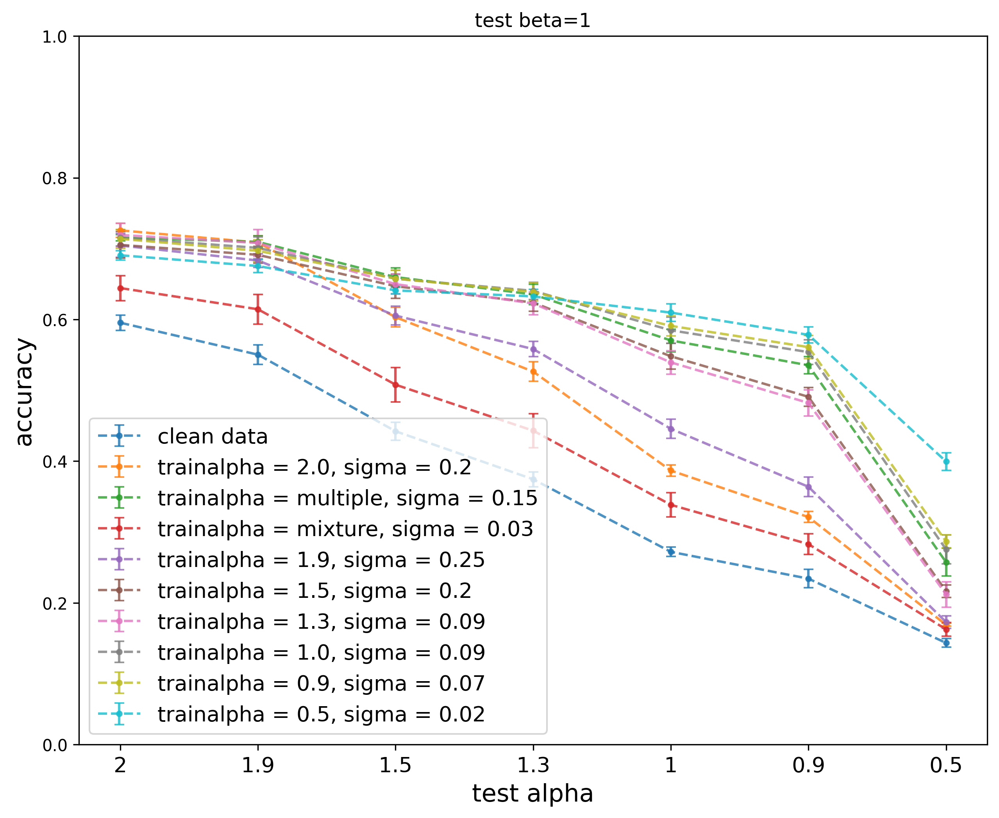

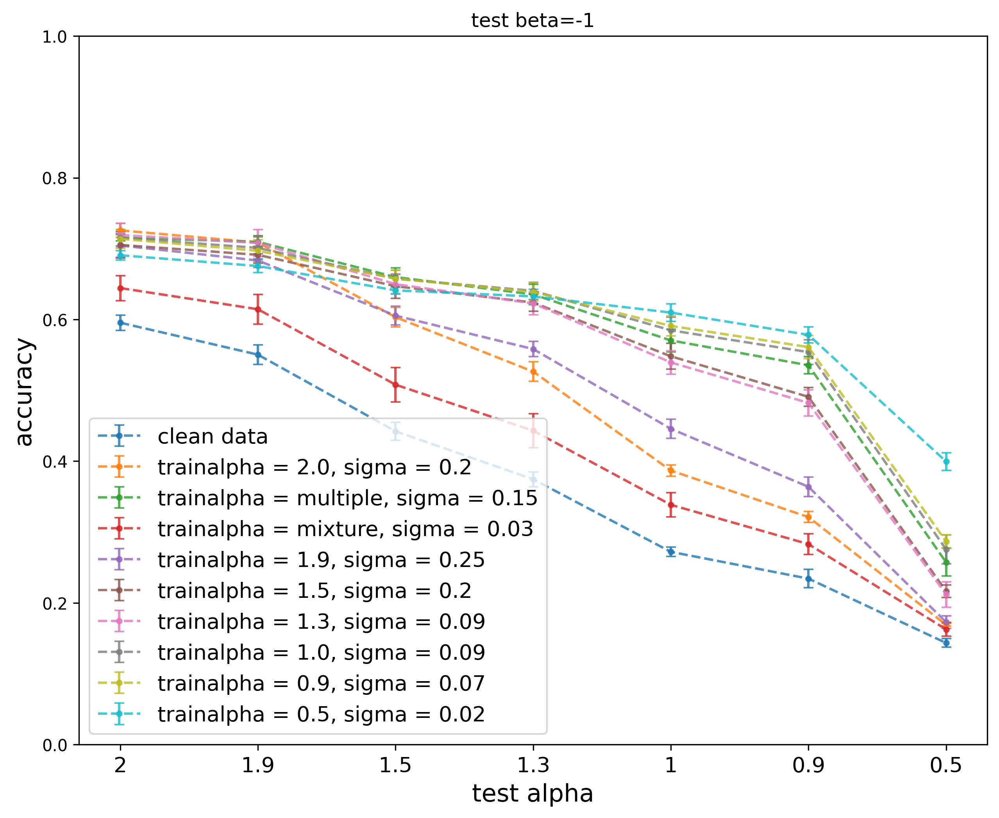

In [18]:
colors = sns.color_palette(n_colors = 10)
for num, beta in enumerate([0.2, -0.2, 0.5, -0.5, 0.8, -0.8, 1, -1]):
    plt.figure(figsize=[10,8],dpi=300)
    i=0
    for alpha in alphas:
        train_sigma = opt_sigma[alpha]
        means = mean_list[i].reshape(8, 8)[1:, num]
        stds = std_list[i].reshape(8, 8)[1:, num]
        # stds = stds[:-1]
        x = ['2', '1.9', '1.5', '1.3', '1', '0.9','0.5']
        if alpha == 0:
            labels = 'clean data'
        plt.errorbar(x,means,yerr=stds,capsize=3,fmt='--.',alpha=0.8,color = colors[i],label =labels)
        i += 1
    plt.xticks(fontsize=13)
    plt.ylim([0, 1])
    plt.xlabel("test alpha",fontsize=15)#横坐标名字
    plt.ylabel("accuracy",fontsize=15)#纵坐标名字
    plt.legend(loc=0,fontsize=13)#图例
    plt.title('test beta={}'.format(beta))
    # plt.title('{} ({}) \n numbers of blocks = {}, numbers of filters = {}'.format(dataset, network,num_blocks,numfilters))
    # plt.savefig('../xq_results_robustness/0812figure/ecg20all_numfilters{}_numbers of blocks{}.png'.format(numfilters,num_blocks),bbox_inches='tight')
    plt.show()

In [68]:
import itertools
alpha_test_list = [0, 2, 1.9, 1.5, 1.3, 1, 0.9, 0.5]
beta_list = [0.2, -0.2, 0.5, -0.5, 0.8, -0.8, 1, -1]
alpha_beta = list(itertools.product(alpha_test_list, beta_list))

In [70]:
res = pd.DataFrame(mean_list, columns=alpha_beta, index=alphas)
res.to_csv('../results/csv/testonassymetric_libras.csv')

generalized gaussian

In [26]:
from scipy.stats import gennorm
def gg_noise(img, shape, loc, scale):
    # 产生stable noise
    noise = gennorm.rvs(shape, loc=loc, scale=scale, size=img.shape)
    # 将噪声和图片叠加
    noisy_out = img + noise
    return noisy_out  #, noise # 这里也会返回噪声，注意返回值

In [33]:
sigma = 0.15
scale = np.sqrt(2) * sigma

y_test = np.tile(y_te, (aug_times_test+1,1))
for beta in [2.5, 2,1.5,1,0.5]:
    X_noise_test = np.tile(X_te,(aug_times_test,1,1))
    X_noise_test = gg_noise(X_noise_test, shape=beta, loc=0, scale=scale)
    X_test = np.vstack((X_te, X_noise_test))
    # fw = open(f"{alpha_test}_libras.txt", "wb")
    fw = open(f"./testset/gg/{beta}_libras_{sigma}.txt", "wb")
    pickle.dump((X_test, y_test), fw)

In [37]:
import models
from tensorflow.keras.optimizers import Nadam
beta_list = [2.5, 2,1.5,1,0.5]
alpha_train_list = [0.0, 2.0, 1.9, 1.5, 1.3, 1.0, 0.9, 0.5, 'mixture', 'multiple']
opt_sigma = {2.0: 0.2,
 'multiple': 0.15,
 'mixture': 0.03,
 1.9: 0.25,
 1.5: 0.2,
 1.3: 0.09,
 1.0: 0.09,
 0.9: 0.07,
 0.5: 0.02,
 0.0: 0.01}
b = 32
lr = 0.001
for alpha_train in alpha_train_list:
    sigma = opt_sigma[alpha_train]
    print(f'sigma={sigma}')
    for depth, width in [(1, 128)]:
        savepath = "../results/acc_LSTM_width{}_depth{}_b{}_alpha{}_sigma{}_0.15_testongg.txt".format(width,depth,b,alpha_train,sigma)
        if os.path.exists(savepath):
            print(savepath, 'exists!')
            continue
        print(f'depth={depth}, width={width}')
        lr = 0.001
        iters = 10000
        optm = Nadam(lr=lr)
        model = models.get_model('lstm_self', input_shape, nb_class, width, depth)
        model.compile(optimizer=optm, loss='categorical_crossentropy', metrics=['accuracy'])
        ls_acc_repeat = []
        for num in range(5):
            model.load_weights('../models/libras_LSTM_width{}_depth{}_b{}_alpha{}_sigma{}_num{}_lr{}_iter{}.h5'.format(width, depth, b, alpha_train, sigma, num, lr, iters))
            ls_acc = []
            for beta in beta_list:
                print('beta=',beta)
                X_test, y_test = pickle.load(open(f"./testset/gg/{beta}_libras_0.15.txt", 'rb'))
                acc = model.evaluate(X_test, y_test)[1]
                print(acc)
                ls_acc.append(acc)
            ls_acc_repeat.append(ls_acc)
            # with open("../results/acc_LSTM_width{}_depth{}_b{}_alpha{}_sigma{}.txt".format(width,depth,b,alpha_train,sigma), "wb") as path_acc:
        with open(savepath, "wb") as path_acc:
            pickle.dump(ls_acc_repeat, path_acc)

sigma=0.01
depth=1, width=128
Model: "model_16"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_17 (InputLayer)        [(None, 45, 2)]           0         
_________________________________________________________________
lstm_16 (LSTM)               (None, 128)               67072     
_________________________________________________________________
dense_16 (Dense)             (None, 15)                1935      
Total params: 69,007
Trainable params: 69,007
Non-trainable params: 0
_________________________________________________________________
beta= 2.5
62/62 [==============================] - 2s 11ms/step - loss: 2.8659 - accuracy: 0.6561
0.65505051612854
beta= 2
62/62 [==============================] - 1s 10ms/step - loss: 3.0060 - accuracy: 0.6439
0.6439393758773804
beta= 1.5
62/62 [==============================] - 1s 9ms/step - loss: 3.1141 - accuracy: 0.6227
0.6227272748947144
beta= 1


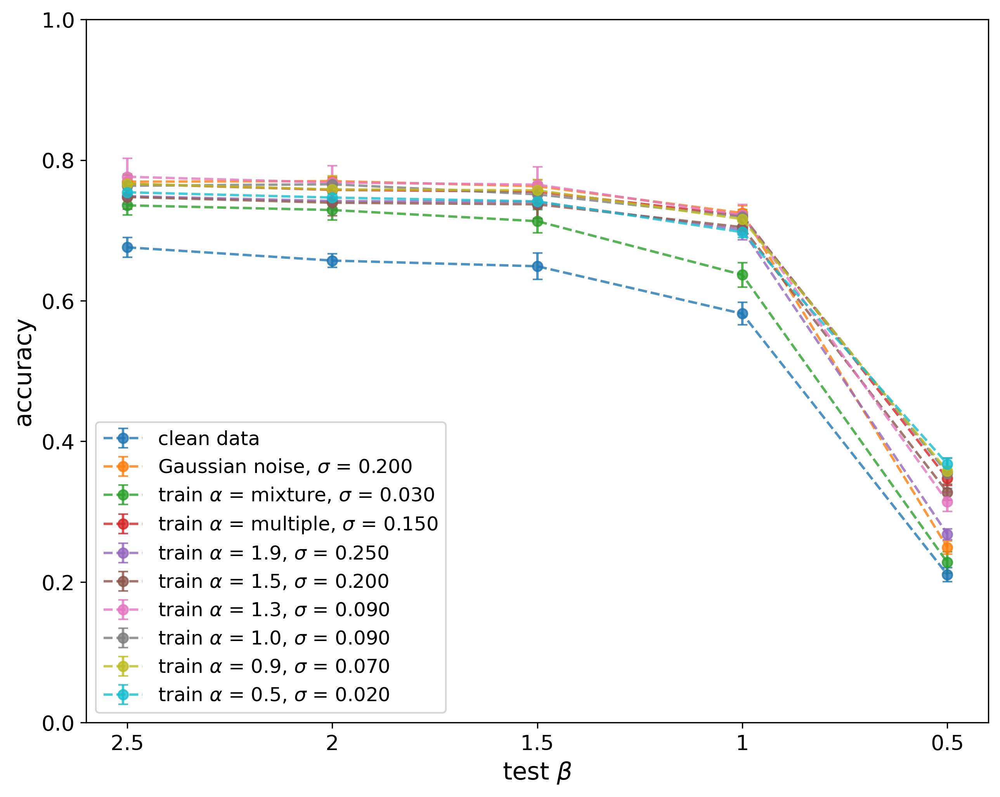

In [5]:
from matplotlib import pyplot
depth, width = 1, 128
opt_sigma = {2.0: 0.2,
 'multiple': 0.15,
 'mixture': 0.03,
 1.9: 0.25,
 1.5: 0.2,
 1.3: 0.09,
 1.0: 0.09,
 0.9: 0.07,
 0.5: 0.02,
 0.0: 0.01}
b = 32
# plt.figure(dpi=300)
alphas = [0.0,2.0,'mixture','multiple',1.9,1.5,1.3,1.0,0.9,0.5]
colors = sns.color_palette(n_colors = 10)
plt.figure(figsize=(10, 8),dpi=300)
i = 0
beta_list = [2.5,2,1.5,1,0.5]
for alpha in alphas:
    # if alpha != 'multiple' and alpha != 'mixture':
    #     alpha = float(alpha)
# for alpha in [1.9]:
    color=colors[i]
    sigma = opt_sigma[alpha]
    # acc_path = f"../results/acc_LSTM_width{width}_depth{depth}_b32_alpha{alpha}_sigma{sigma}.txt"
    acc_path = f"../results/acc_LSTM_width{width}_depth{depth}_b32_alpha{alpha}_sigma{sigma}_0.15_testongg.txt"
    if os.path.exists(acc_path) == 0:
        print('no exists,', acc_path)
        continue
    f = open(acc_path, 'rb')
    try:
        acc = pickle.load(f)
    except:
        print("the file is empty, alpha={}".format(alpha))
        continue
    df = pd.DataFrame(acc)
    npdf = np.array(df)
    means = np.array(npdf.mean(axis=0).round(decimals=4))
    stds = np.array(npdf.std(axis=0).round(decimals=4))
    x = [str(beta) for beta in beta_list]
    gamma = np.sqrt(1/2) * sigma
    if alpha == 0:
        labels = 'clean data'
    elif alpha == 2:
        labels = 'Gaussian noise, $\sigma$ = {:.3f}'.format(sigma)
    else:
        labels = 'train $\\alpha$ = {}, $\sigma$ = {:.3f}'.format(alpha, sigma)
    plt.errorbar(x,means,yerr=stds,capsize=3,fmt='--o',alpha=0.8,color = color,label =labels)
    i=i+1
plt.xticks(fontsize=13)
plt.yticks(fontsize=13)
plt.ylim([0, 1])
plt.xlabel("test $\\beta$",fontsize=15)#横坐标名字
plt.ylabel("accuracy",fontsize=15)#纵坐标名字
plt.legend(loc=0,fontsize=12)#图例
plt.show()

In [42]:
res = pd.DataFrame(mean_list, columns=beta_list, index=alphas)
res.to_csv('../results/csv/testongg_libras.csv')

student-t

In [3]:
from scipy.stats import t
def t_noise(img, df, loc, scale):
    # 产生stable noise
    noise = t.rvs(df, loc=loc, scale=scale, size=img.shape)
    # 将噪声和图片叠加
    noisy_out = img + noise
    return noisy_out #, noise # 这里也会返回噪声，注意返回值

In [6]:
sigma = 0.15

y_test = np.tile(y_te, (aug_times_test+1,1))
# for df in [1, 2, 3, 5, 10, 20]:
for df in [0.1, 0.3, 0.5, 0.8, 1, 1.3, 1.5, 1.7, 1.9, 2, 3]:
    X_noise_test = np.tile(X_te,(aug_times_test,1,1))
    X_noise_test = t_noise(X_noise_test, df=df, loc=0, scale=sigma)
    X_test = np.vstack((X_te, X_noise_test))
    # fw = open(f"{alpha_test}_libras.txt", "wb")
    fw = open(f"./testset/t/{df}_libras_{sigma}.txt", "wb")
    pickle.dump((X_test, y_test), fw)

In [8]:
import models
from tensorflow.keras.optimizers import Nadam
df_list = [0.1, 0.3, 0.5, 0.8, 1, 1.3, 1.5, 1.7, 1.9, 2, 3]
alpha_train_list = [0.0, 2.0, 1.9, 1.5, 1.3, 1.0, 0.9, 0.5, 'mixture', 'multiple']
opt_sigma = {2.0: 0.2,
 'multiple': 0.15,
 'mixture': 0.03,
 1.9: 0.25,
 1.5: 0.2,
 1.3: 0.09,
 1.0: 0.09,
 0.9: 0.07,
 0.5: 0.02,
 0.0: 0.01}
b = 32
lr = 0.001
for alpha_train in alpha_train_list:
    sigma = opt_sigma[alpha_train]
    print(f'sigma={sigma}')
    for depth, width in [(1, 128)]:
        savepath = "../results/acc_LSTM_width{}_depth{}_b{}_alpha{}_sigma{}_0.15_testont.txt".format(width,depth,b,alpha_train,sigma)
        if os.path.exists(savepath):
            print(savepath, 'exists!')
            continue
        print(f'depth={depth}, width={width}')
        lr = 0.001
        iters = 10000
        optm = Nadam(lr=lr)
        model = models.get_model('lstm_self', input_shape, nb_class, width, depth)
        model.compile(optimizer=optm, loss='categorical_crossentropy', metrics=['accuracy'])
        ls_acc_repeat = []
        for num in range(5):
            model.load_weights('../models/libras_LSTM_width{}_depth{}_b{}_alpha{}_sigma{}_num{}_lr{}_iter{}.h5'.format(width, depth, b, alpha_train, sigma, num, lr, iters))
            ls_acc = []
            for df in df_list:
                print('df=',df)
                X_test, y_test = pickle.load(open(f"./testset/t/{df}_libras_0.15.txt", 'rb'))
                acc = model.evaluate(X_test, y_test)[1]
                print(acc)
                ls_acc.append(acc)
            ls_acc_repeat.append(ls_acc)
            # with open("../results/acc_LSTM_width{}_depth{}_b{}_alpha{}_sigma{}.txt".format(width,depth,b,alpha_train,sigma), "wb") as path_acc:
        with open(savepath, "wb") as path_acc:
            pickle.dump(ls_acc_repeat, path_acc)

sigma=0.01
depth=1, width=128
Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 45, 2)]           0         
_________________________________________________________________
lstm (LSTM)                  (None, 128)               67072     
_________________________________________________________________
dense (Dense)                (None, 15)                1935      
Total params: 69,007
Trainable params: 69,007
Non-trainable params: 0
_________________________________________________________________


NameError: name 'alpha_test' is not defined

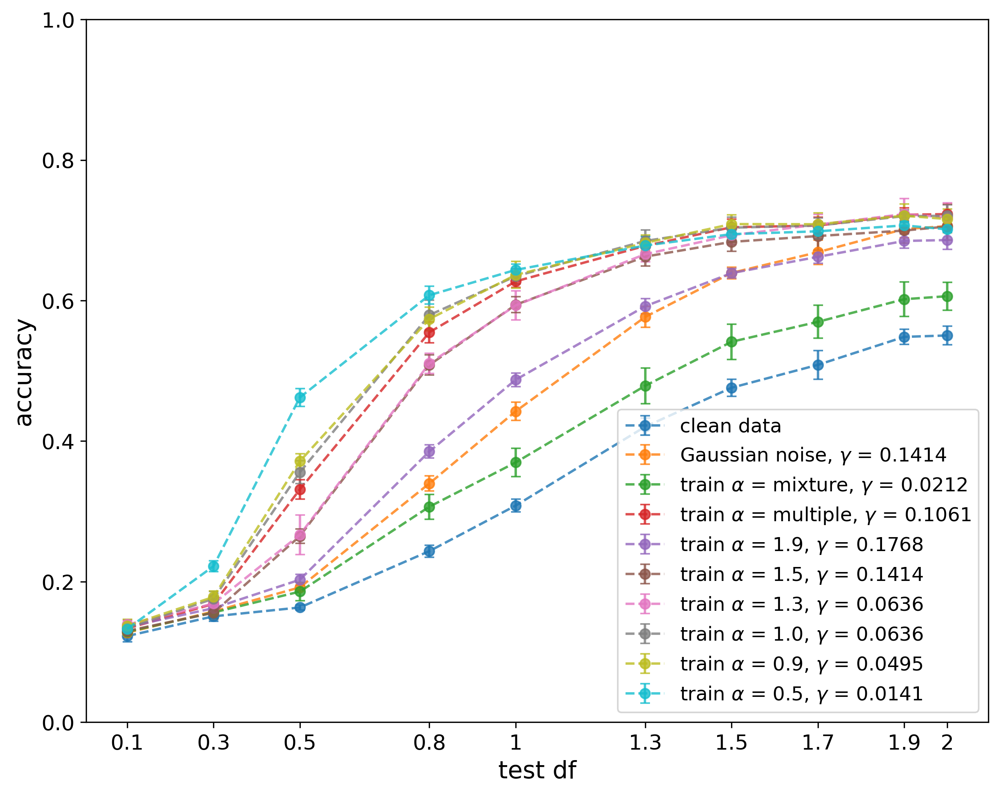

In [4]:
from matplotlib import pyplot
depth, width = 1, 128
opt_sigma = {2.0: 0.2,
 'multiple': 0.15,
 'mixture': 0.03,
 1.9: 0.25,
 1.5: 0.2,
 1.3: 0.09,
 1.0: 0.09,
 0.9: 0.07,
 0.5: 0.02,
 0.0: 0.01}
b = 32
# plt.figure(dpi=300)
alphas = [0.0,2.0,'mixture','multiple',1.9,1.5,1.3,1.0,0.9,0.5]
colors = sns.color_palette(n_colors = 10)
plt.figure(figsize=(10, 8),dpi=300)
i = 0
df_list = [0.1, 0.3, 0.5, 0.8, 1, 1.3, 1.5, 1.7, 1.9, 2, 3]
for alpha in alphas:
    # if alpha != 'multiple' and alpha != 'mixture':
    #     alpha = float(alpha)
# for alpha in [1.9]:
    color=colors[i]
    sigma = opt_sigma[alpha]
    # acc_path = f"../results/acc_LSTM_width{width}_depth{depth}_b32_alpha{alpha}_sigma{sigma}.txt"
    acc_path = f"../results/acc_LSTM_width{width}_depth{depth}_b32_alpha{alpha}_sigma{sigma}_0.15_testont.txt"
    if os.path.exists(acc_path) == 0:
        print('no exists,', acc_path)
        continue
    f = open(acc_path, 'rb')
    try:
        acc = pickle.load(f)
    except:
        print("the file is empty, alpha={}".format(alpha))
        continue
    df = pd.DataFrame(acc)
    npdf = np.array(df)
    means = np.array(npdf.mean(axis=0).round(decimals=4))
    stds = np.array(npdf.std(axis=0).round(decimals=4))
    x = df_list[:-1]
    gamma = np.sqrt(1/2) * sigma
    if alpha == 0:
        labels = 'clean data'
    elif alpha == 2:
        labels = 'Gaussian noise, $\gamma$ = {:.4f}'.format(gamma)
    else:
        labels = 'train $\\alpha$ = {}, $\gamma$ = {:.4f}'.format(alpha, gamma)
    plt.errorbar(x,means[:-1],yerr=stds[:-1],capsize=3,fmt='--o',alpha=0.8,color = color,label =labels)
    i=i+1
plt.xticks(x, x, fontsize=13)
plt.yticks(fontsize=13)
plt.ylim([0, 1])
plt.xlabel("test df",fontsize=15)#横坐标名字
plt.ylabel("accuracy",fontsize=15)#纵坐标名字
plt.legend(loc=0,fontsize=12)#图例
plt.savefig('figure/libras_t.png')
plt.show()

In [52]:
res = pd.DataFrame(mean_list, columns=df_list, index=alphas)
res.to_csv('../results/csv/testont_libras.csv')